# Rainfall Prediction - Weather Forecasting



Problem Statement:

- Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

# Problem Statement: 
- Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

- Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.



# Dataset Description:


- Date  - The date of observation

- Location  -The common name of the location of the weather station

- MinTemp  -The minimum temperature in degrees celsius

- MaxTemp -The maximum temperature in degrees celsius

- Rainfall  -The amount of rainfall recorded for the day in mm

- Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

- Sunshine  -The number of hours of bright sunshine in the day.

- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

- WindDir9am -Direction of the wind at 9am

- WindDir3pm -Direction of the wind at 3pm

- WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

- WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

- Humidity9am -Humidity (percent) at 9am

- Humidity3pm -Humidity (percent) at 3pm

- Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

- Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

- Cloud9am - Fraction of sky obscured by cloud at 9am. 

- Cloud3pm -Fraction of sky obscured by cloud 

- Temp9am-Temperature (degrees C) at 9am

- Temp3pm -Temperature (degrees C) at 3pm

- RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

- RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [2]:
# importing important library
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [3]:
df1=pd.read_csv("Rainfall_Predict.csv")

In [4]:
# Making a copy to df
df=pd.DataFrame(data=df1)

In [5]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [6]:
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [7]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [8]:
type(df)

pandas.core.frame.DataFrame

In [9]:
df.shape

(8425, 23)

In [10]:
df.size

193775

In [11]:
df.ndim

2

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

## Observation Shows:

Columns are:
- 16 columns for float64 
- 07 columns for object

Memory usage:
- 1.5+ MB

# Null Values

In [13]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Text(0.5, 1.0, 'Heatmap Representing Null Values')

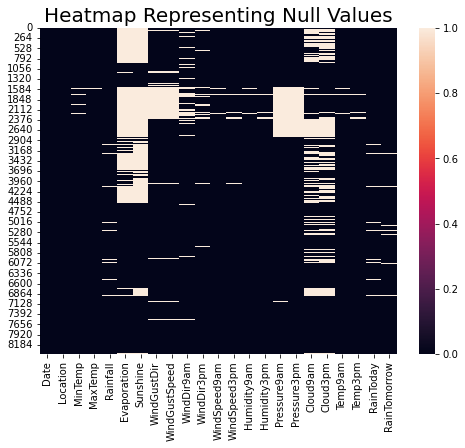

In [14]:
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.title("Heatmap Representing Null Values",fontsize=20)

# Checking Unique Values

### 1. Categorical Columns

In [15]:
for i in df.columns:
    if df[i].dtype=='object':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  Date 

['2008-12-01' '2008-12-02' '2008-12-03' ... '2013-06-06' '2013-06-07'
 '2013-06-08']
**************************************************
Column  Location 

['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']
**************************************************
Column  WindGustDir 

['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']
**************************************************
Column  WindDir9am 

['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']
**************************************************
Column  WindDir3pm 

['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' nan 'NE']
**************************************************
Column  RainToday 

['No' 'Yes' nan]
**************************************************
Column  RainTomorrow 

['No' 'Yes' nan]
*******************

In [16]:
# Shows Nan Values in RainToday, RainTomorrow

### 2. Numerical Columns 

In [17]:
for i in df.columns:
    if df[i].dtype=='float64':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  MinTemp 

[13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1 15.9 12.6  8.4  9.8
 14.1 13.5 11.2 11.5 17.1 20.5 15.3 16.2 16.9 20.1 19.7 12.5 12.  11.3
  9.6 10.5 12.3 13.7 16.1 14.  17.  17.3 17.2 17.4 19.8 14.9 13.9 18.6
 19.3 24.4 18.8 20.8 15.7 18.5 20.4 21.8 22.3 22.  28.  21.5 21.7 23.5
 28.3 18.4 12.4 13.3 18.  18.7 15.5  8.9 15.  15.4 16.  12.8 13.2 13.8
  7.6  8.3 11.  20.9 16.4 10.   8.8  9.3 14.4 10.8 10.1  9.1 10.4 12.2
 10.7  7.8  8.1  7.5  8.2 11.6 13.   9.9  3.5  6.6  7.   5.7  6.2  6.
 10.6  8.6  4.5  5.4  2.1  1.8  7.2  4.6  4.2  5.2  4.1  3.2  4.3  3.7
  3.6  6.9 10.3  3.   2.6  5.1  4.4  4.7  6.7  8.   2.2  1.7  2.8  9.
  6.3 -2.  -1.3  2.   0.5  1.2  0.6  0.9  5.   3.9  3.4  0.  -1.5 -1.7
 -0.4  0.1  4.8  5.9  2.9 -0.6 -0.3 -1.   0.8 -0.1  1.3  3.3  6.5 -0.8
  1.9  6.8  2.7  1.6  5.5  7.3  0.2  5.8  7.1  1.1  1.   6.1  nan  5.3
  4.  11.7  8.5  3.8  6.4  9.5 14.5 15.6 17.8 16.7 18.1 12.1 11.4 18.3
 11.9 21.  11.1 18.2 14.2 11.8 13.6 12.7 15.1 22.9 17.6 21.1 

In [18]:
# float64 shows nan values in their columns

# Checking the duplicated value in DataFrame

In [19]:
df.duplicated().sum()

1663

### Observation: Shows 1663 duplicated rows 

In [20]:
df[df.duplicated()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
3679,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
3680,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
3681,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
3682,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
3683,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


### Duplicate rows varies with change in columns

In [21]:
df.duplicated(subset=['Temp3pm']).value_counts()

True     8096
False     329
dtype: int64

In [22]:
df.duplicated(subset=['Temp3pm','WindDir3pm']).value_counts()

True     5381
False    3044
dtype: int64

### Checking Non- Duplicated Rows

In [23]:
(~df.duplicated()).sum()

6762

In [24]:
df.loc[df.duplicated(keep='first'), :]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
3679,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
3680,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
3681,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
3682,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
3683,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


In [25]:
df.loc[df.duplicated(keep='last'), :]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2822,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
2823,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
2824,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
2825,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
2826,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
2827,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
2828,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
2829,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
2830,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
2831,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


# NOTE:
- Duplicated rows have been determined. We will proceed and delete the rows

# Droping Duplicate Rows

In [26]:
df.drop_duplicates(inplace=True)

In [27]:
df.duplicated().sum()

0

In [28]:
df.shape

(6762, 23)

# Percentage of Missing Data

In [29]:
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

In [30]:
for i in df.columns:
    Total_Value=len(df[i])
    Missing_Value=df[i].isnull().sum()
    print(i ,"Missing percentage :",round(((Missing_Value/Total_Value)*100),2))

Date Missing percentage : 0.0
Location Missing percentage : 0.0
MinTemp Missing percentage : 1.04
MaxTemp Missing percentage : 0.84
Rainfall Missing percentage : 2.04
Evaporation Missing percentage : 43.2
Sunshine Missing percentage : 47.86
WindGustDir Missing percentage : 13.93
WindGustSpeed Missing percentage : 13.93
WindDir9am Missing percentage : 11.74
WindDir3pm Missing percentage : 4.35
WindSpeed9am Missing percentage : 0.93
WindSpeed3pm Missing percentage : 1.48
Humidity9am Missing percentage : 0.8
Humidity3pm Missing percentage : 1.42
Pressure9am Missing percentage : 19.34
Pressure3pm Missing percentage : 19.39
Cloud9am Missing percentage : 27.6
Cloud3pm Missing percentage : 28.13
Temp9am Missing percentage : 0.75
Temp3pm Missing percentage : 1.36
RainToday Missing percentage : 2.04
RainTomorrow Missing percentage : 2.04


# Replacing Null Values

In [31]:
from sklearn.impute import SimpleImputer
si_cat=SimpleImputer(missing_values=np.nan,strategy='most_frequent')
si_num=SimpleImputer(missing_values=np.nan,strategy='median')

#  Replace Categorical Variable
for i in df.columns:
    if df[i].dtype=='object':
        df[i]=si_cat.fit_transform(df[i].values.reshape(-1,1))
        
# Replace Numerical and float value:

for i in df.columns:
    if df[i].dtype=='float64':
        df[i]=si_num.fit_transform(df[i].values.reshape(-1,1))

In [32]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [33]:
df['RainTomorrow'].unique()

array(['No', 'Yes'], dtype=object)

In [34]:
# deleting rows which won't add any value to target variable.
df.drop(['Date'],axis=1,inplace=True)

Text(0.5, 1.0, ' Heat Showing Null Missing value ')

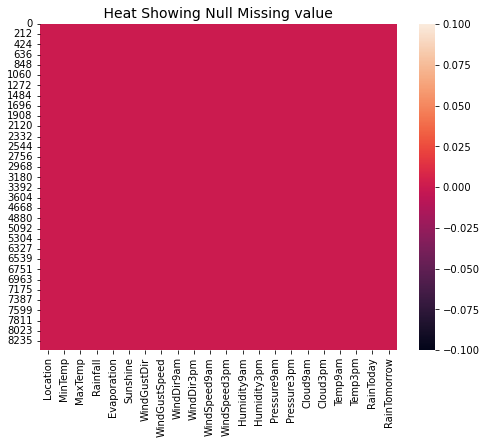

In [35]:
# Visualization on heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.title(" Heat Showing Null Missing value ", fontsize=14)

# EDA (Exploratory Data Analysis)

# Univariate Analysis

Name of the location of the weather station
 PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


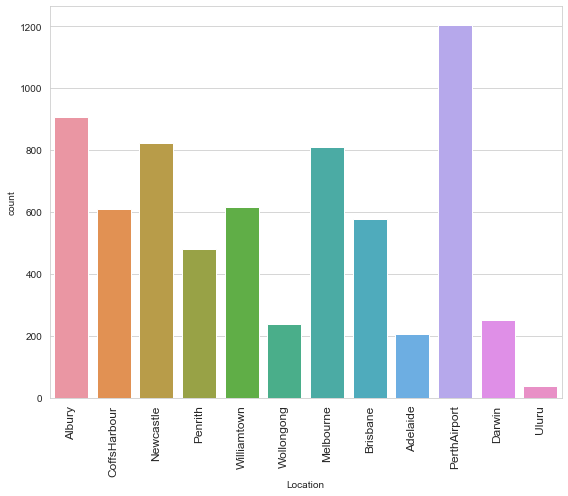

In [36]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='Location',data=df)
print("Name of the location of the weather station\n",df['Location'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Graph Location Shows:

- PerthAirport    1204
- Albury           907
- Newcastle        822
- Melbourne        811
- Williamtown      615
- CoffsHarbour     611
- Brisbane         579
- Penrith          482
- Darwin           250
- Wollongong       237
- Adelaide         205
- Uluru             39

### Maximum prediction is done from Perth Airport weather station and Uluru Shows the lowest prediction.

Minimum Temp  -2.0 Maximum Temp  28.5


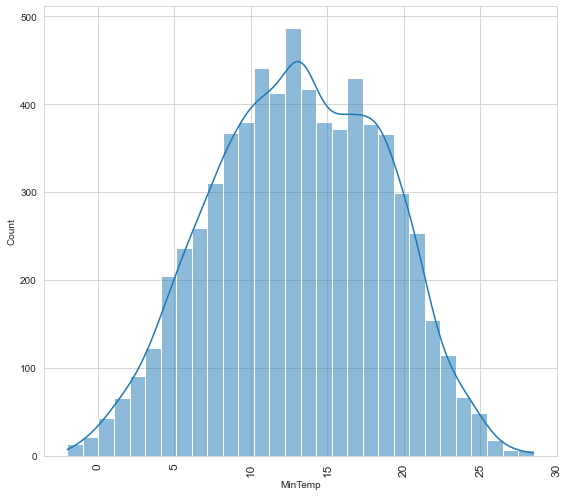

In [37]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='MinTemp',data=df,bins=30,kde=True)
print("Minimum Temp ",df['MinTemp'].min(),"Maximum Temp ",df['MinTemp'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Column MinTemp shows:  
- Minimum Temp  -2.0
- Maximum Temp  28.5

#### Maximum Frequency/counts Lies between 10 to 15

Minimum Temp  8.2 Maximum Temp  45.5


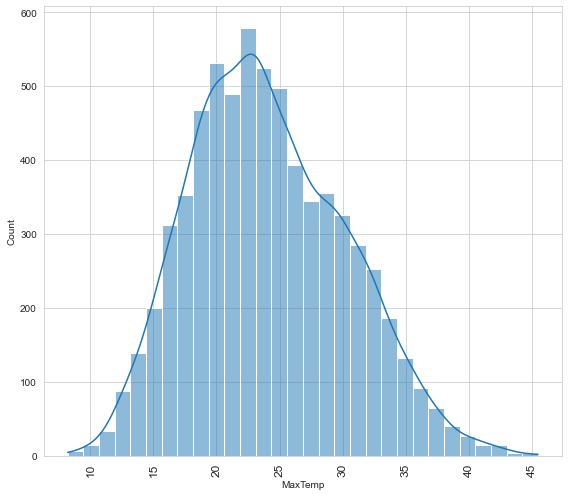

In [38]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='MaxTemp',data=df,bins=30,kde=True)
print("Minimum Temp ",df['MaxTemp'].min(),"Maximum Temp ",df['MaxTemp'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

MaxTemp Column Shows:

- Minimum Temp  8.2 
- Maximum Temp  45.5

#### Maximum MaxTemp lies between 20 to 25. 

Minimum Rainfall  0.0 Maximum Rainfall  371.0


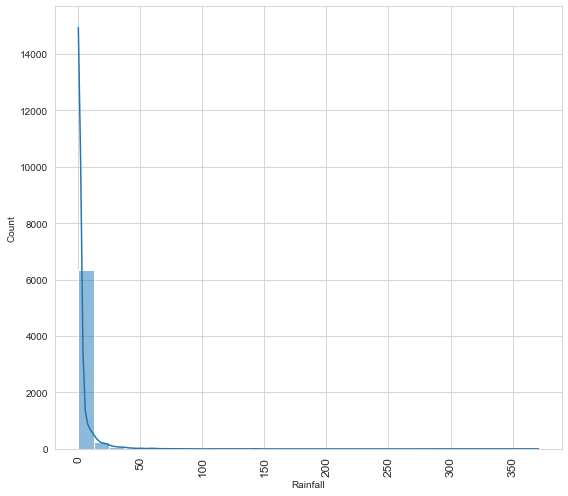

In [39]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Rainfall',data=df,bins=30,kde=True)
print("Minimum Rainfall ",df['Rainfall'].min(),"Maximum Rainfall ",df['Rainfall'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Frequency lies between 0 to 50

#### Rainfall Graph Shows " Minimum Rainfall  0.0 Maximum Rainfall  371.0

Minimum Evaporation  0.0 Maximum Evaporation  145.0


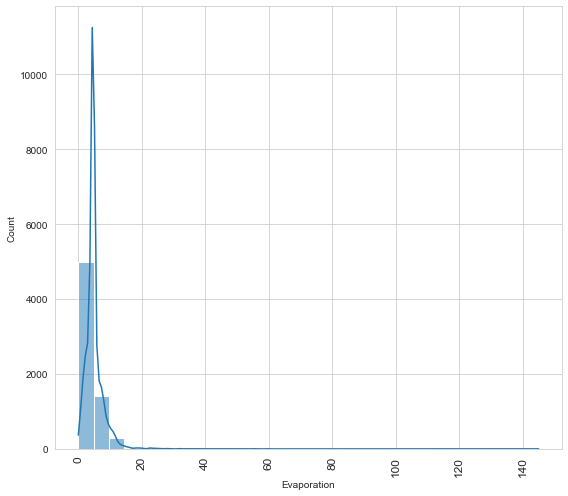

In [40]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Evaporation',data=df,bins=30,kde=True)
print("Minimum Evaporation ",df['Evaporation'].min(),"Maximum Evaporation ",df['Evaporation'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Evaporation count lies between 0 to 15

#### Minimum Evaporation  0.0 Maximum Evaporation  145.0

Minimum Sunshine  0.0 Maximum Sunshine  13.9


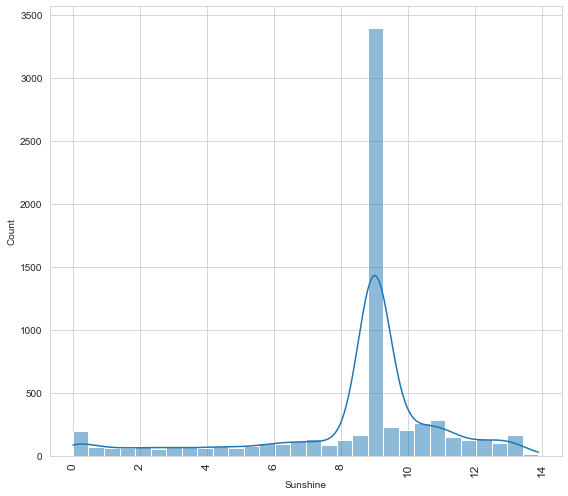

In [41]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Sunshine',data=df,bins=30,kde=True)
print("Minimum Sunshine ",df['Sunshine'].min(),"Maximum Sunshine ",df['Sunshine'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Frequency lies between 8 to 10

#### Minimum Sunshine  0.0 Maximum Sunshine  13.9

The direction of the strongest wind gust in the 24 hours to midnight
 E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


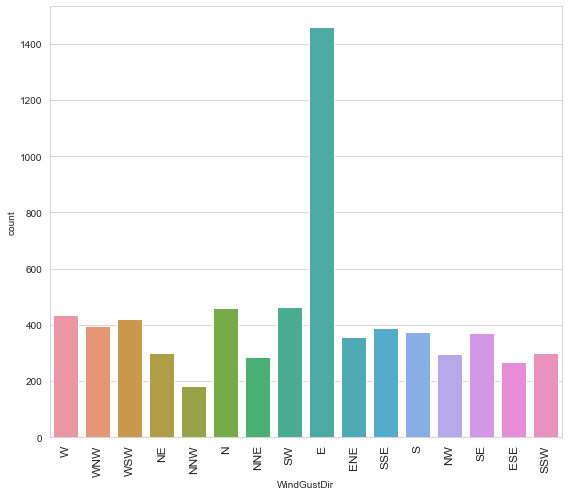

In [42]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='WindGustDir',data=df)
print("The direction of the strongest wind gust in the 24 hours to midnight\n",df['WindGustDir'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Column Shows:

- E      1460
- SW      465
- N       459
- W       434
- WSW     420
- WNW     398
- SSE     390
- S       376
- SE      370
- ENE     357
- NE      300
- SSW     299
- NW      296
- NNE     287
- ESE     267
- NNW     184

#### Brief increase in the speed towards  East Direction having Maximum Count  1460 and Minimum Counts toward NNW 184

Minimum WindGustSpeed  7.0 Maximum WindGustSpeed  107.0


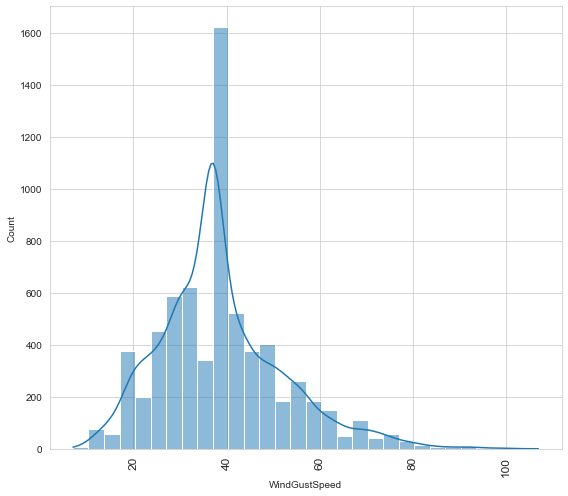

In [43]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='WindGustSpeed',data=df,bins=30,kde=True)
print("Minimum WindGustSpeed ",df['WindGustSpeed'].min(),"Maximum WindGustSpeed ",df['WindGustSpeed'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

- Minimum WindGustSpeed is 7.0 
- Maximum WindGustSpeed is 107.0

#### Brief increase in the speed of the wind Maximum Frequency lies between  30 to 40

The Direction of the wind at 9am
 N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


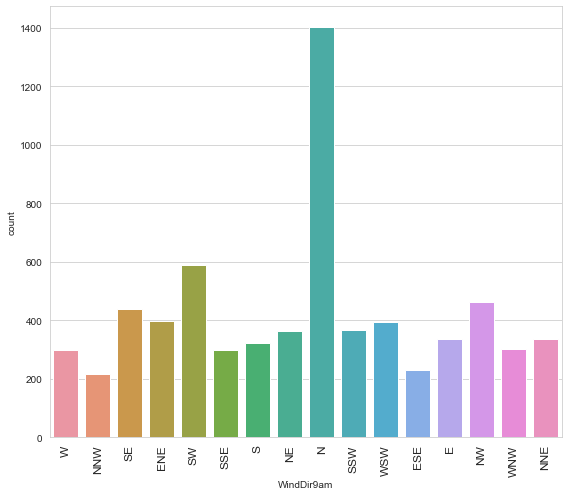

In [44]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='WindDir9am',data=df)
print("The Direction of the wind at 9am\n",df['WindDir9am'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

The Direction of the wind at 9 am shows various directions counts
- N      1403
- SW      590
- NW      463
- SE      439
- ENE     397
- WSW     394
- SSW     368
- NE      364
- E       338
- NNE     337
- S       324
- WNW     301
- SSE     300
- W       299
- ESE     229
- NNW     216

Maximum Wind at 9 am blows through North.

The Direction of the wind at 3pm 
 SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


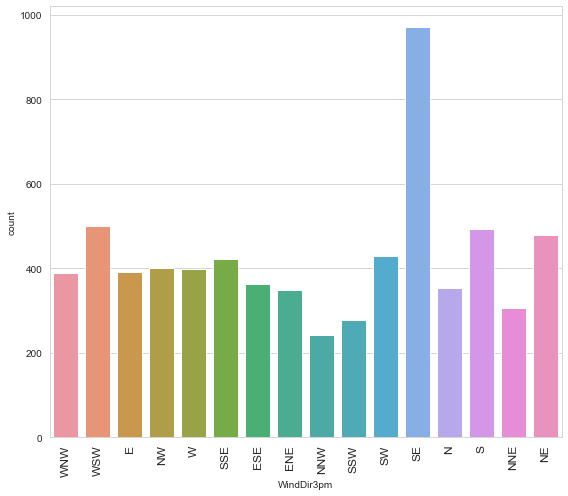

In [45]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='WindDir3pm',data=df)
print("The Direction of the wind at 3pm \n",df['WindDir3pm'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

The Direction of the wind at 3pm shows various Direction Wind Flow. 
- SE     971
- WSW    499
- S      493
- NE     480
- SW     428
- SSE    421
- NW     400
- W      399
- E      392
- WNW    389
- ESE    363
- N      354
- ENE    348
- NNE    305
- SSW    277
- NNW    243

#### Maximum Winds Blows towards South East, North-NorthWest Shows

Minimum Wind Speed at 9am  0.0 Maximum Wind Speed at 9am  63.0


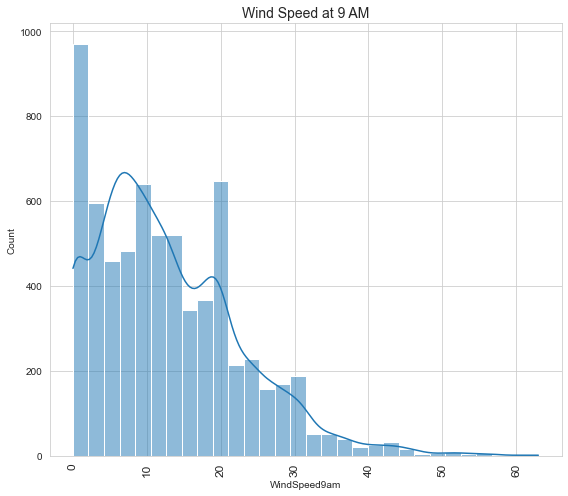

In [46]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='WindSpeed9am',data=df,bins=30,kde=True)
print("Minimum Wind Speed at 9am ",df['WindSpeed9am'].min(),"Maximum Wind Speed at 9am ",df['WindSpeed9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Wind Speed at 9am  0.0
- Maximum Wind Speed at 9am  63.0

#### Maximum Wind Speed By 9 AM lies 0 to 10 followed by 10 to 20

Minimum Wind Speed at 3pm  0.0 Maximum Wind Speed at 3pm  83.0


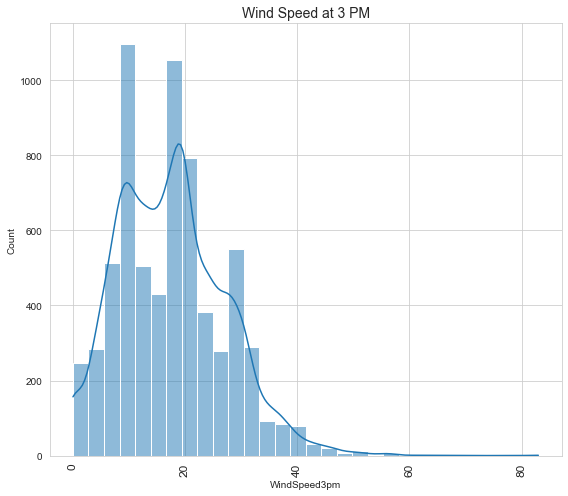

In [47]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='WindSpeed3pm',data=df,bins=30,kde=True)
print("Minimum Wind Speed at 3pm ",df['WindSpeed3pm'].min(),"Maximum Wind Speed at 3pm ",df['WindSpeed3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Wind Speed at 3 PM",fontsize=14)
plt.tight_layout()

- Minimum Wind Speed at 3pm  00.0 
- Maximum Wind Speed at 3pm  83.0

#### Maximum Wind Speed Frequency lies between 10 to 20

Minimum Humidity at 9am  10.0 Maximum Humidity at 9am  100.0


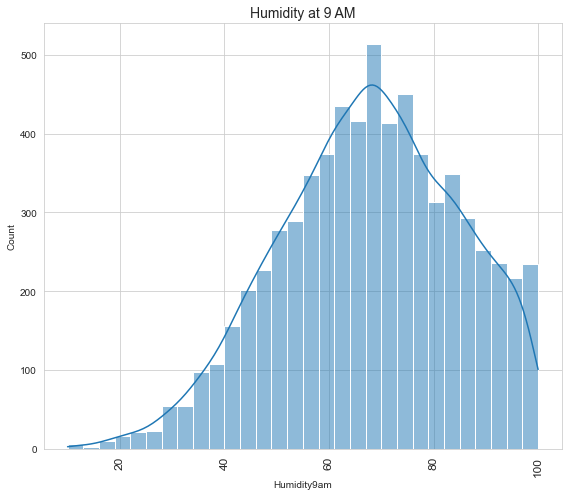

In [48]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Humidity9am',data=df,bins=30,kde=True)
print("Minimum Humidity at 9am ",df['Humidity9am'].min(),"Maximum Humidity at 9am ",df['Humidity9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Humidity at 9 AM",fontsize=14)
plt.tight_layout()

Minimum Humidity at 9am  10.0
Maximum Humidity at 9am  100.0

Minimum Humidity at 3PM 6.0 Maximum Humidity3pm  99.0


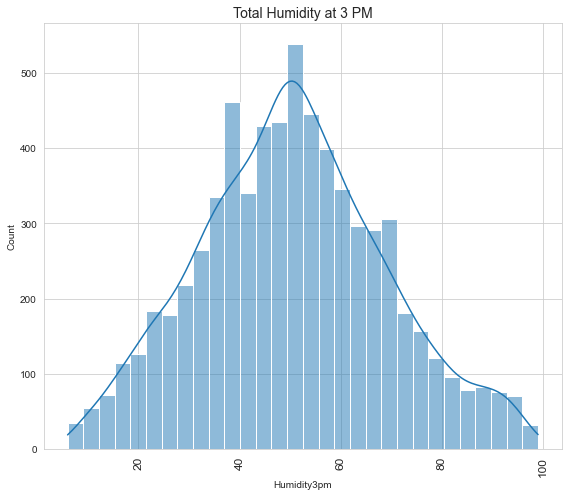

In [49]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Humidity3pm',data=df,bins=30,kde=True)
print("Minimum Humidity at 3PM",df['Humidity3pm'].min(),"Maximum Humidity3pm ",df['Humidity3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Total Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Humidity at 3PM 6.0 Maximum Humidity3pm  99.0

Minimum Pressure at 9am  989.8 Maximum Pressure at 9am  1039.0


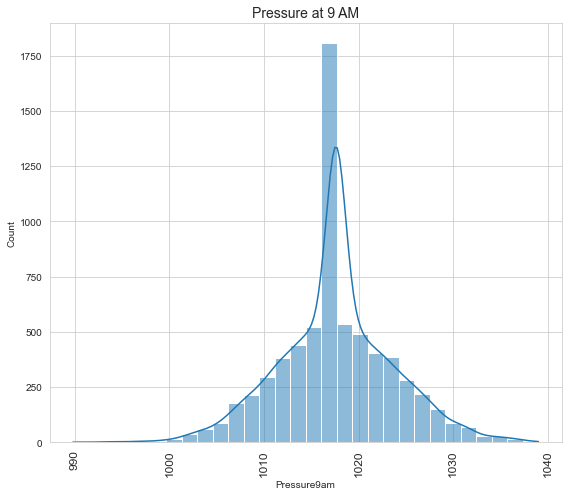

In [50]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Pressure9am',data=df,bins=30,kde=True)
print("Minimum Pressure at 9am ",df['Pressure9am'].min(),"Maximum Pressure at 9am ",df['Pressure9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Pressure at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Pressure at 9am  989.8 
- Maximum Pressure at 9am  1039.0

#### Maximum PRESSURE LIES at 9AM between 105 to 1021

Minimum Pressure at 3pm  982.9 Maximum Pressure at 3pm  1036.0


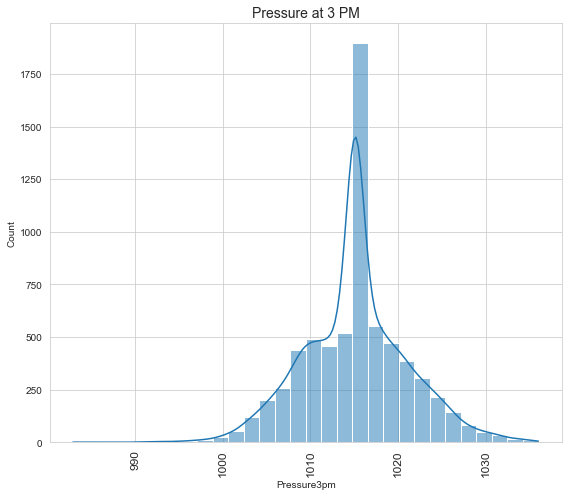

In [51]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Pressure3pm',data=df,bins=30,kde=True)
print("Minimum Pressure at 3pm ",df['Pressure3pm'].min(),"Maximum Pressure at 3pm ",df['Pressure3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Pressure at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Pressure at 3pm  982.9
Maximum Pressure at 3pm  1036.0

Minimum Cloud At 9 AM  0.0 Maximum Cloud At 9 AM  8.0


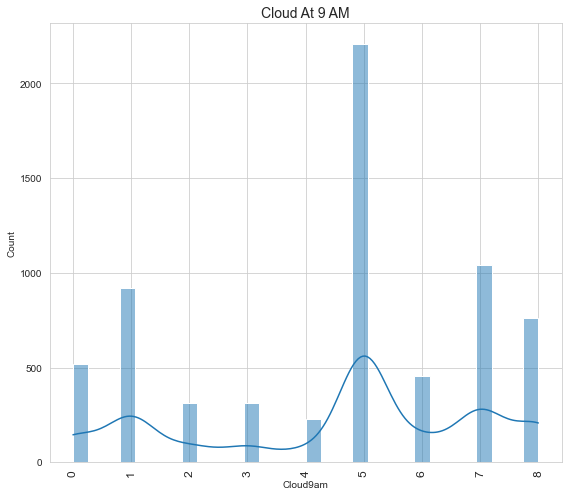

In [52]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Cloud9am',data=df,bins=30,kde=True)
print("Minimum Cloud At 9 AM ",df['Cloud9am'].min(),"Maximum Cloud At 9 AM ",df['Cloud9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Cloud At 9 AM",fontsize=14)
plt.tight_layout()

Minimum Cloud At 9 AM  0.0 
Maximum Cloud At 9 AM  8.0

Maximum frequency lies at 5

Minimum Temp at 3PM  7.3 Maximum Temp st 3 PM 44.1


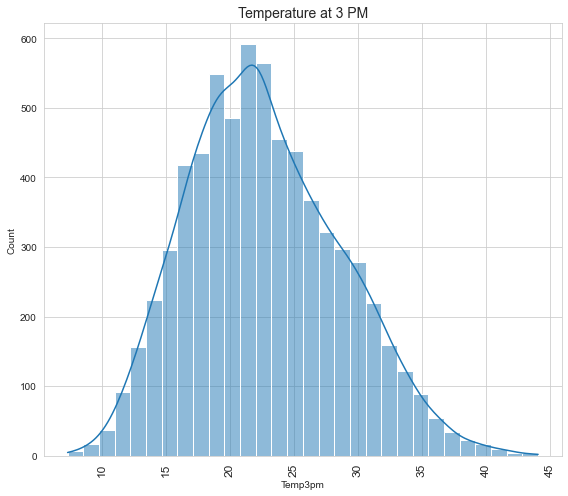

In [53]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Temp3pm',data=df,bins=30,kde=True)
print("Minimum Temp at 3PM ",df['Temp3pm'].min(),"Maximum Temp st 3 PM",df['Temp3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Temperature at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Temp at 3PM  7.3
Maximum Temp st 3 PM 44.1

Minimum Temp at 9 AM  1.9 Maximum Temperature at 9 AM  39.4


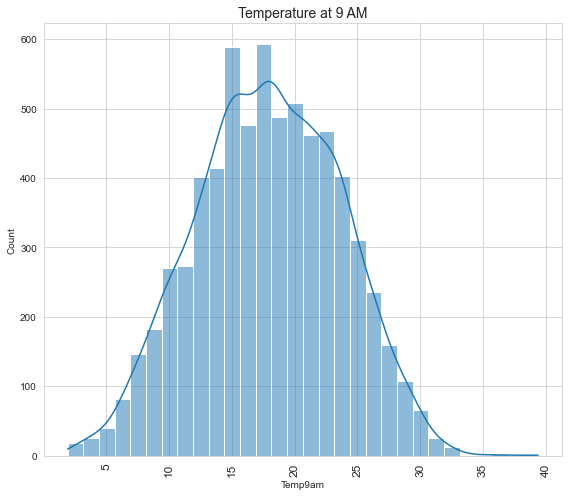

In [54]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='Temp9am',data=df,bins=30,kde=True)
print("Minimum Temp at 9 AM ",df['Temp9am'].min(),"Maximum Temperature at 9 AM ",df['Temp9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Temperature at 9 AM",fontsize=14)
plt.tight_layout()

Minimum Temp at 9 AM  1.9 
Maximum Temperature at 9 AM  39.4

 Counts Showing Rain 
 No     5190
Yes    1572
Name: RainToday, dtype: int64


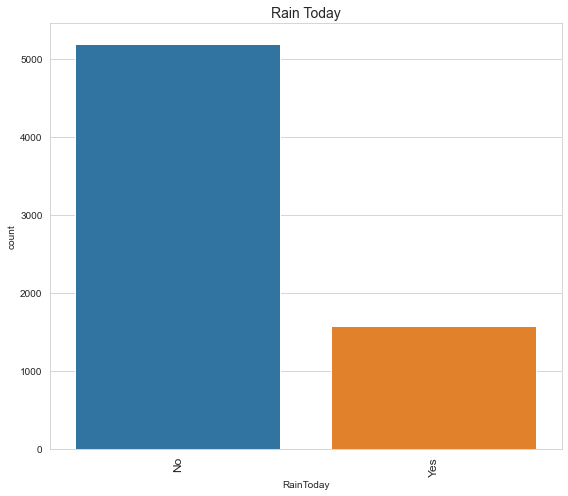

In [55]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='RainToday',data=df)
print(" Counts Showing Rain \n",df['RainToday'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Rain Today",fontsize=14)
plt.tight_layout()

Counts Showing Rain 
- No     5190
- Yes    1572

 Counts Showing Rain Tomorrow 
 No     5190
Yes    1572
Name: RainTomorrow, dtype: int64


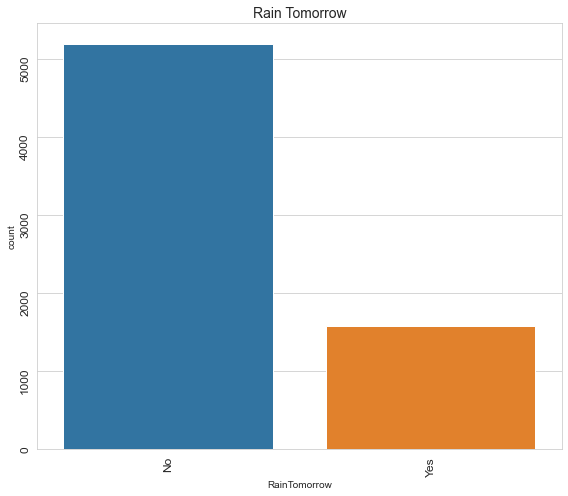

In [56]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='RainTomorrow',data=df)
print(" Counts Showing Rain Tomorrow \n",df['RainTomorrow'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=90,fontsize=12)
plt.title("Rain Tomorrow",fontsize=14)
plt.tight_layout()

Counts Showing Rain Tomorrow 
No     5190
Yes    1572

# Bi-Variate Analysis

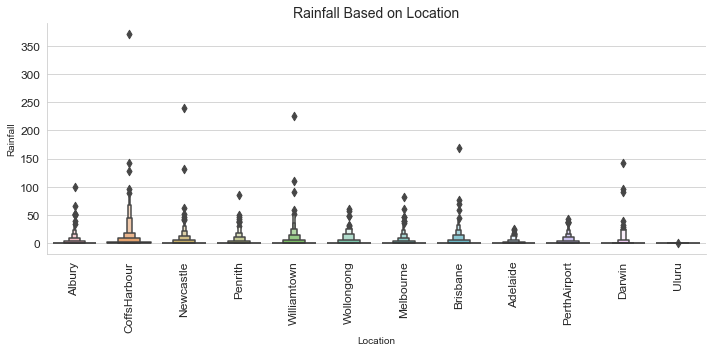

In [57]:
sns.catplot(kind='boxen',x='Location',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Location",fontsize=14)
plt.tight_layout()

Adelaide shows lowest rainfall and CoffsHarbour Shows Maximum Rain

<Figure size 576x432 with 0 Axes>

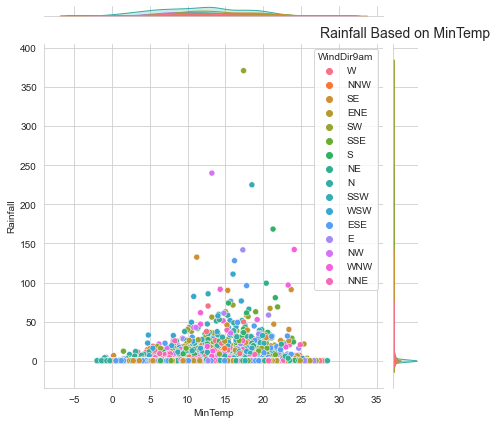

In [58]:
plt.figure(figsize=(8,6))
sns.jointplot(x='MinTemp',y='Rainfall',hue='WindDir9am',data=df,height=6,ratio=10)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum rain lies between Min Temp 10 to 20

<Figure size 576x432 with 0 Axes>

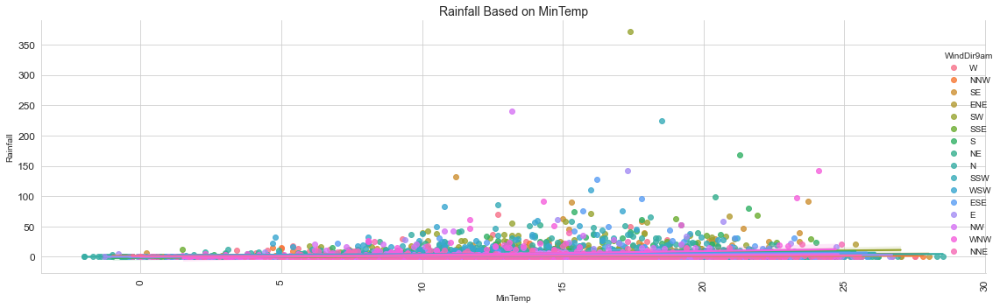

In [59]:
plt.figure(figsize=(8,6))
sns.lmplot(x='MinTemp',y='Rainfall',hue='WindDir9am',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

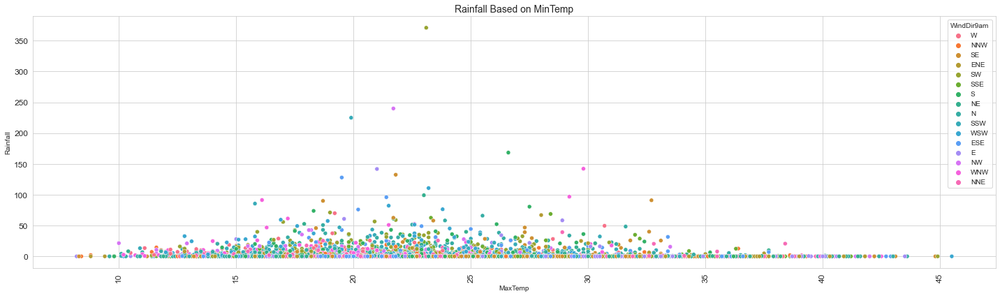

In [60]:
plt.figure(figsize=(20,6))
sns.scatterplot(x='MaxTemp',y='Rainfall',hue='WindDir9am',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

As MaximumTemperature shows Maximum rainfall in Temp range 15 to 25 shows maximum rain.

<Figure size 576x432 with 0 Axes>

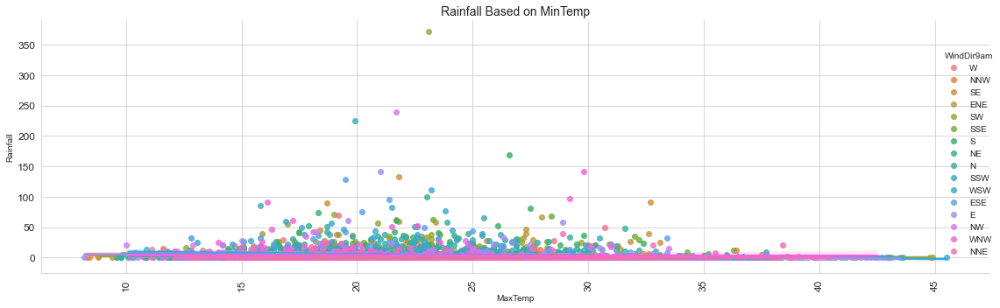

In [61]:
plt.figure(figsize=(8,6))
sns.lmplot(x='MaxTemp',y='Rainfall',hue='WindDir9am',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

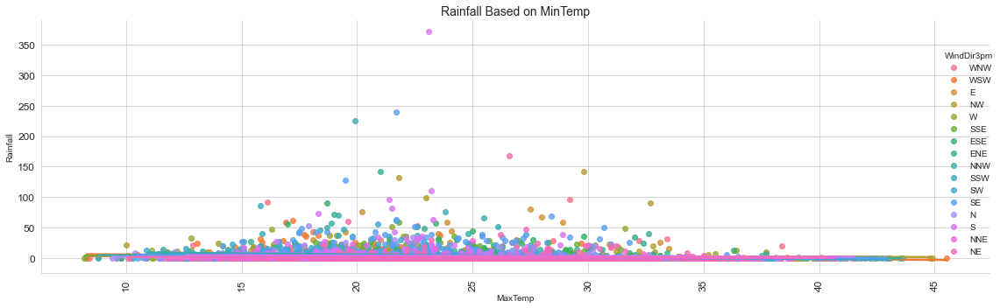

In [62]:
plt.figure(figsize=(8,6))
sns.lmplot(x='MaxTemp',y='Rainfall',hue='WindDir3pm',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Wind Direction doesn't play much role in Rainfall if temperature ranges 35 to 45

In [ ]:
plt.figure(figsize=(8,6))
sns.histplot(x='Evaporation',y='Rainfall',hue='WindGustDir',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Evaporation",fontsize=14)
plt.tight_layout()

KeyboardInterrupt: 

East Wind plays a high role in rainfall, Humidity is a minor factor for rain

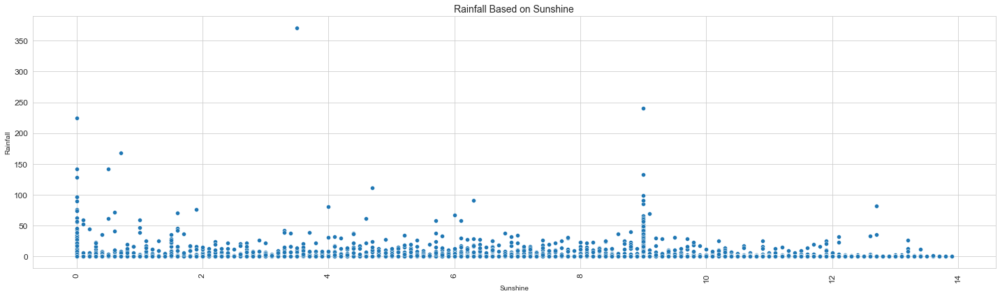

In [64]:
plt.figure(figsize=(20,6))
sns.scatterplot(x='Sunshine',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Sunshine",fontsize=14)
plt.tight_layout()

Don't show a good relation with Rainfall

<Figure size 576x432 with 0 Axes>

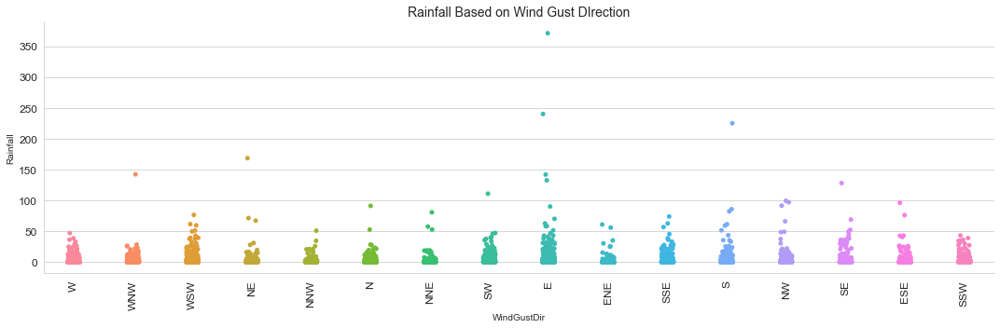

In [65]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindGustDir',y='Rainfall',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Gust DIrection",fontsize=14)
plt.tight_layout()

East, WSW plays an important factor for rain followed by others 

<Figure size 576x432 with 0 Axes>

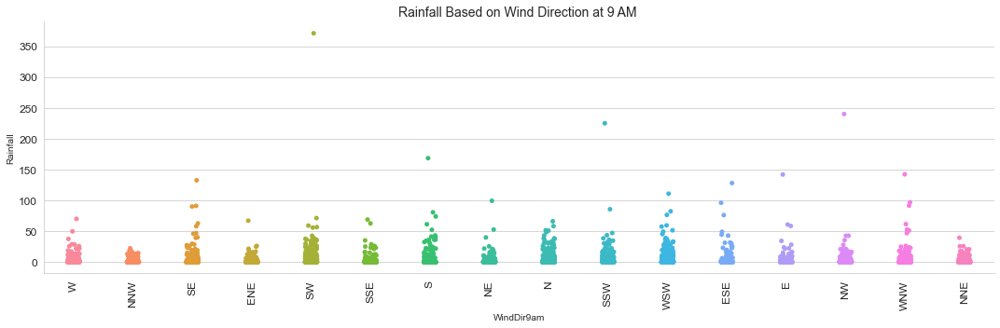

In [66]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindDir9am',y='Rainfall',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Direction at 9 AM ",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

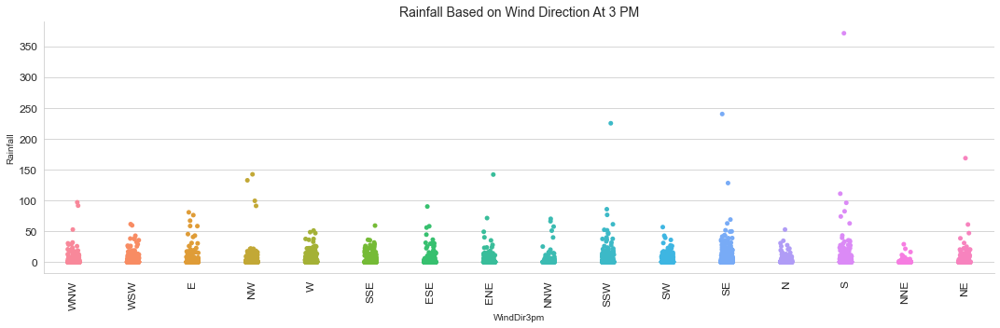

In [67]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindDir3pm',y='Rainfall',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Direction At 3 PM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

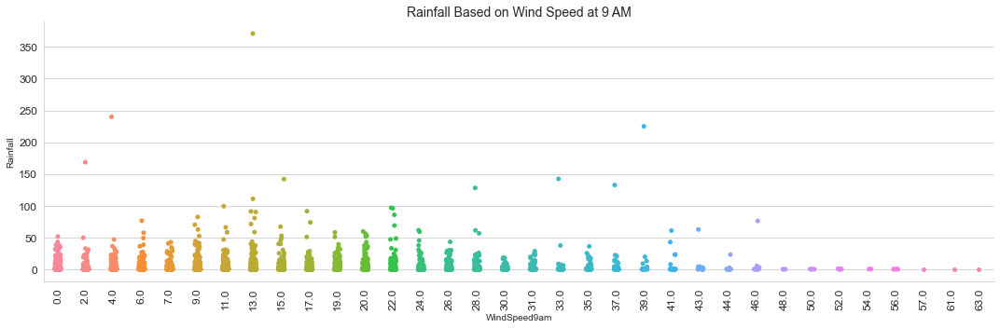

In [68]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindSpeed9am',y='Rainfall',data=df,aspect=3,kind='strip')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

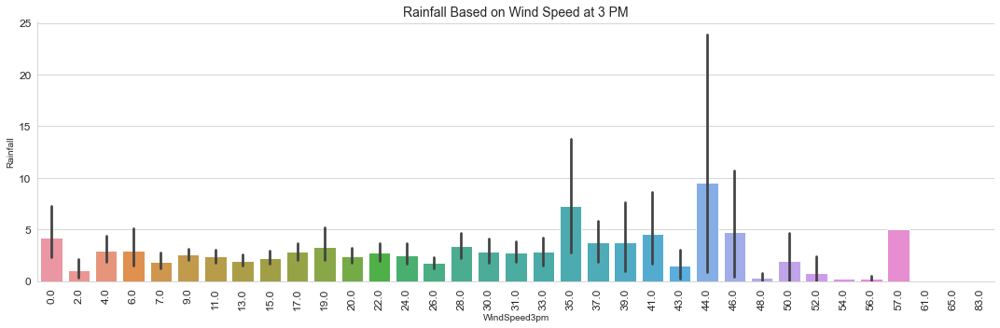

In [69]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindSpeed3pm',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Speed at 3 PM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

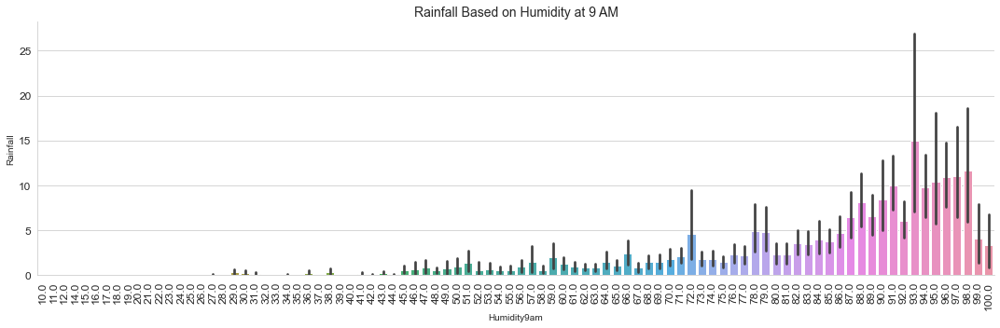

In [70]:
plt.figure(figsize=(8,6))
sns.catplot(x='Humidity9am',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Humidity at 9 AM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

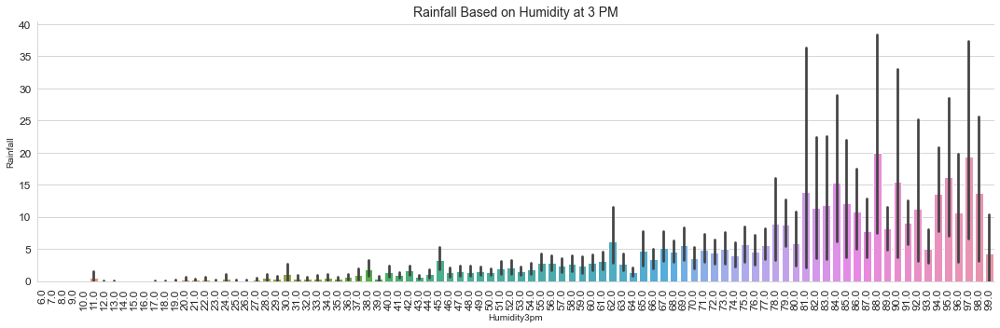

In [71]:
plt.figure(figsize=(8,6))
sns.catplot(x='Humidity3pm',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Humidity at 3 PM",fontsize=14)
plt.tight_layout()

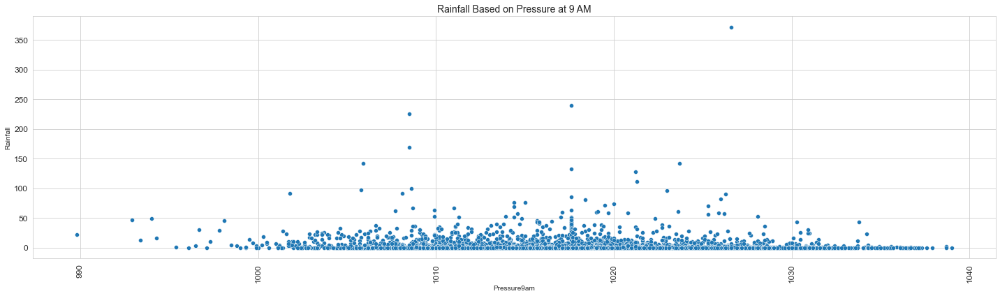

In [72]:
plt.figure(figsize=(20,6))
sns.scatterplot(x='Pressure9am',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Pressure at 9 AM",fontsize=14)
plt.tight_layout()

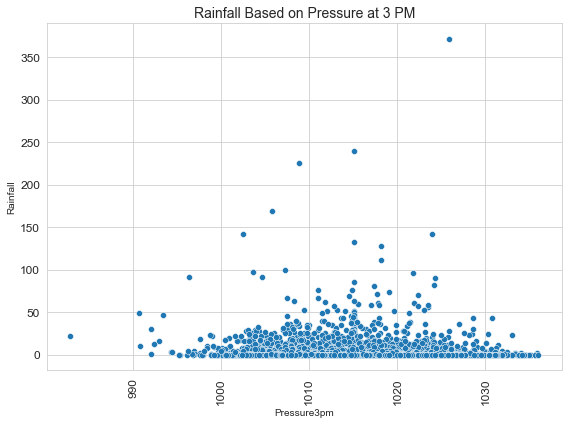

In [73]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Pressure at 3 PM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

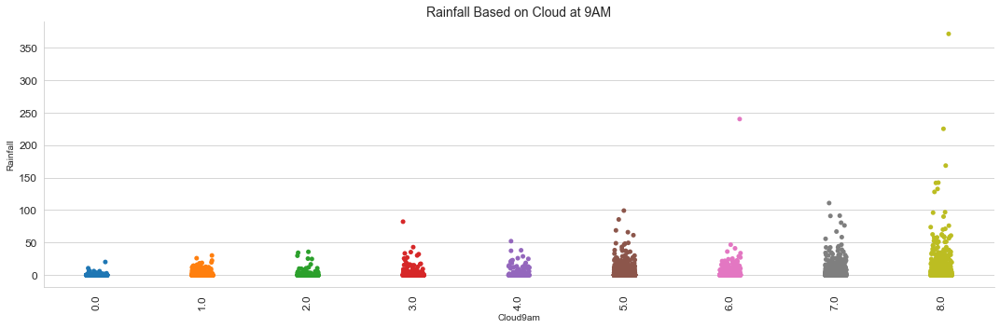

In [74]:
plt.figure(figsize=(8,6))
sns.catplot(x='Cloud9am',y='Rainfall',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Cloud at 9AM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

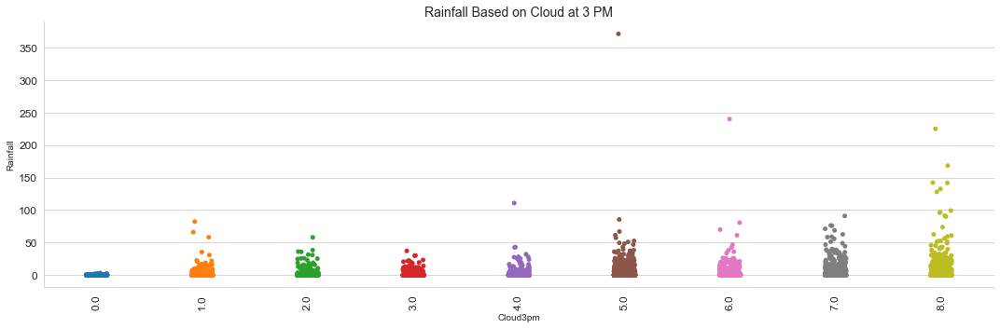

In [75]:
plt.figure(figsize=(8,6))
sns.catplot(x='Cloud3pm',y='Rainfall',data=df,aspect=3)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Cloud at 3 PM",fontsize=14)
plt.tight_layout()

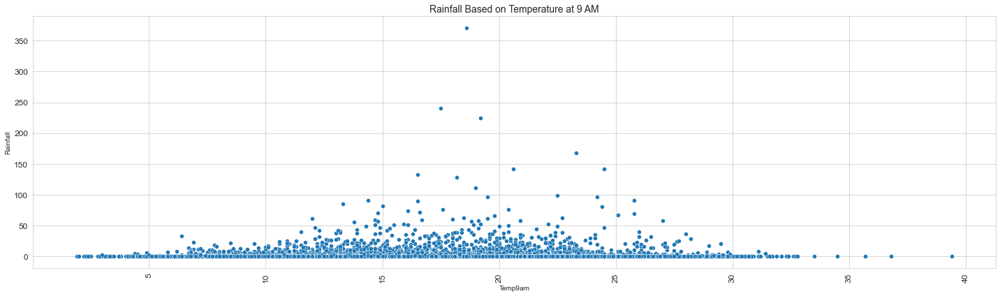

In [76]:
plt.figure(figsize=(20,6))
sns.scatterplot(x='Temp9am',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Temperature at 9 AM",fontsize=14)
plt.tight_layout()

<Figure size 1440x432 with 0 Axes>

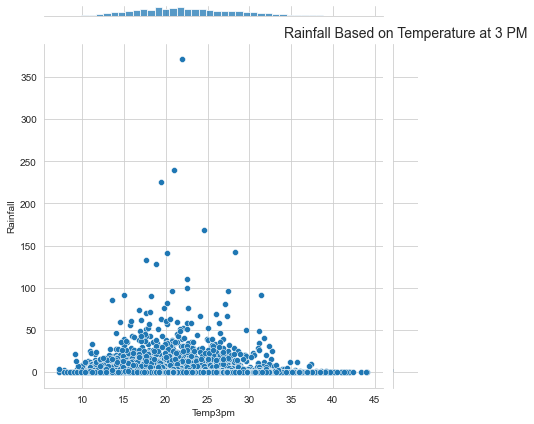

In [77]:
plt.figure(figsize=(20,6))
sns.jointplot(x='Temp3pm',y='Rainfall',data=df,ratio=10,kind='scatter')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Temperature at 3 PM",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

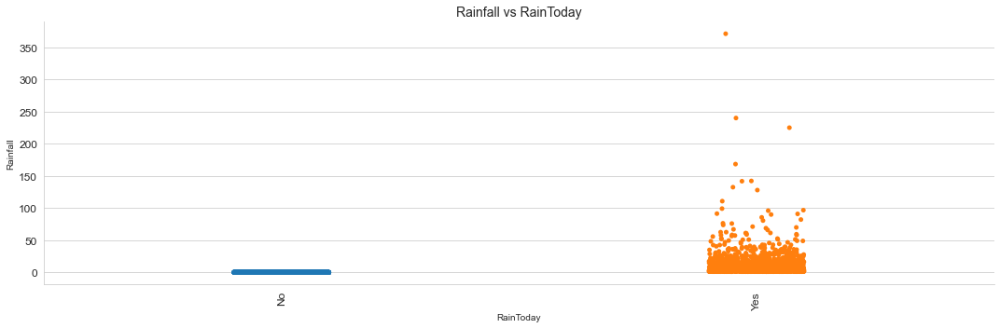

In [78]:
plt.figure(figsize=(8,6))
sns.catplot(x='RainToday',y='Rainfall',data=df,aspect=3,kind='strip')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall vs RainToday",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

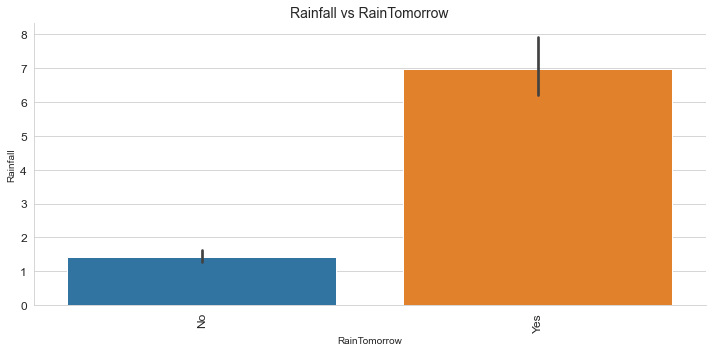

In [79]:
plt.figure(figsize=(8,6))
sns.catplot(x='RainTomorrow',y='Rainfall',data=df,aspect=2,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall vs RainTomorrow",fontsize=14)
plt.tight_layout()

### RainTomorrow Vs Other Aspects

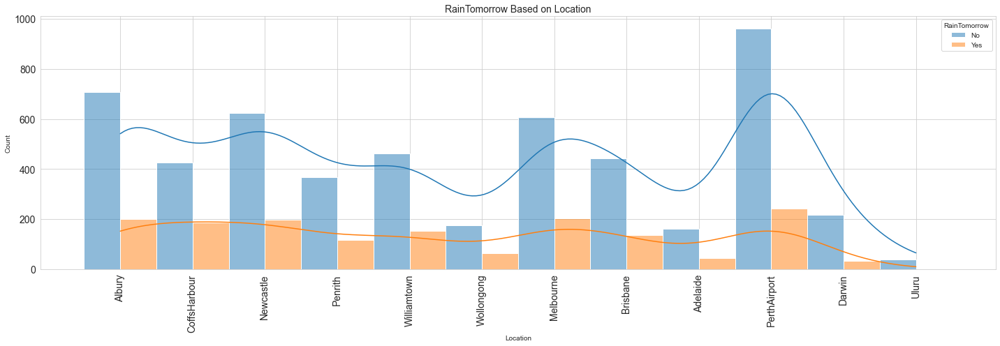

In [80]:
plt.figure(figsize=(20,7))
sns.histplot(x='Location',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Location",fontsize=14)
plt.tight_layout()

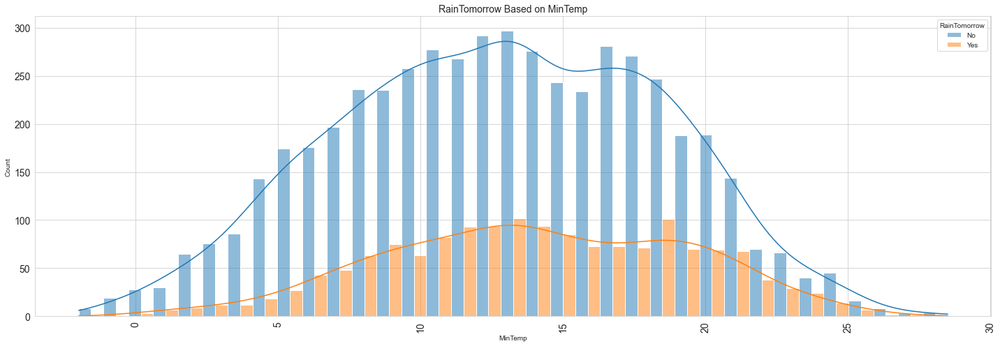

In [81]:
plt.figure(figsize=(20,7))
sns.histplot(x='MinTemp',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on MinTemp",fontsize=14)
plt.tight_layout()

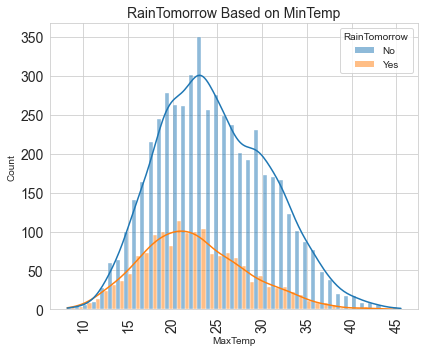

In [82]:
plt.figure(figsize=(6,5))
sns.histplot(x='MaxTemp',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on MinTemp",fontsize=14)
plt.tight_layout()

<Figure size 432x360 with 0 Axes>

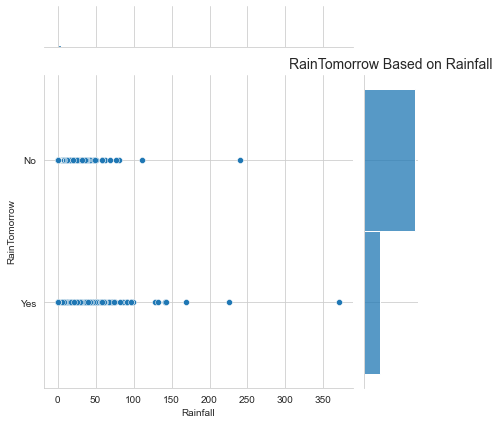

In [83]:
plt.figure(figsize=(6,5))
sns.jointplot(x='Rainfall',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Rainfall",fontsize=14)
plt.tight_layout()

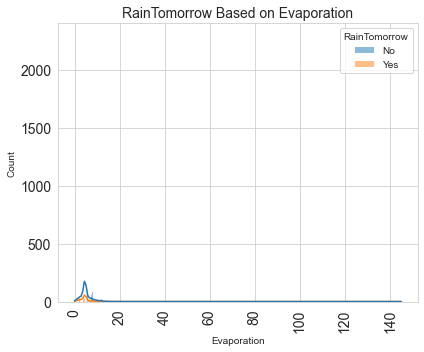

In [84]:
plt.figure(figsize=(6,5))
sns.histplot(x='Evaporation',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Evaporation",fontsize=14)
plt.tight_layout()

<Figure size 432x360 with 0 Axes>

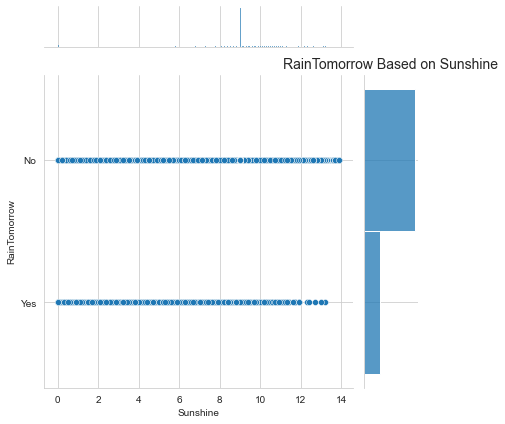

In [85]:
plt.figure(figsize=(6,5))
sns.jointplot(x='Sunshine',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Sunshine",fontsize=14)
plt.tight_layout()

Sunshine 8 to 10 increases the chance of rain

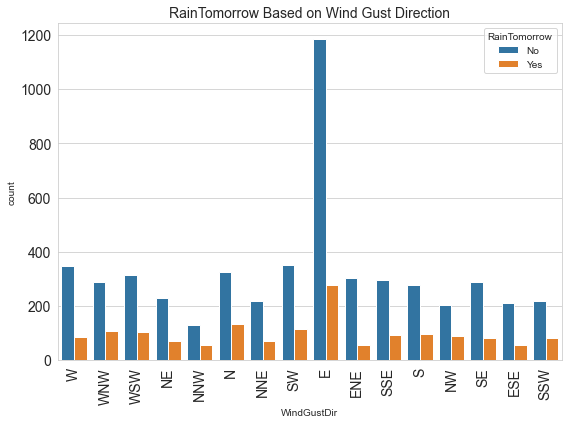

In [86]:
plt.figure(figsize=(8,6))
sns.countplot(x='WindGustDir',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Gust Direction",fontsize=14)
plt.tight_layout()

East Wind Gust Direction Shows high chance of Rainfall followed by others

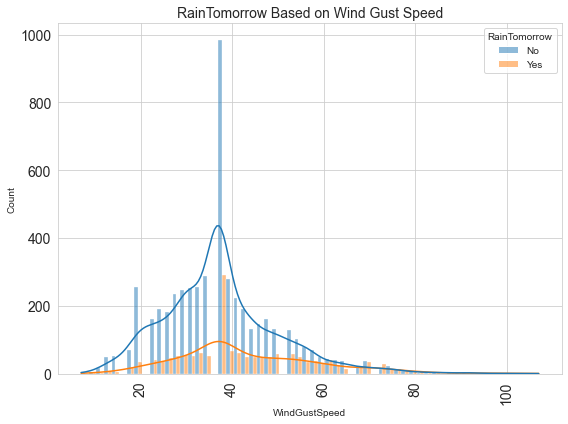

In [87]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindGustSpeed',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Gust Speed",fontsize=14)
plt.tight_layout()

Chance of rainfall is very high if speed of wind is 40

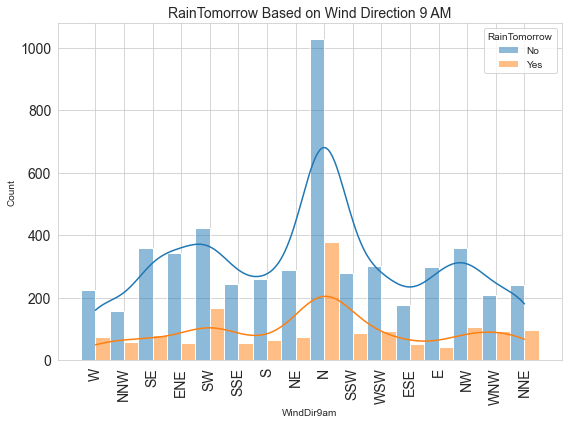

In [88]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindDir9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Direction 9 AM",fontsize=14)
plt.tight_layout()

Maximum Wind Blow through North Shows high chance of rain

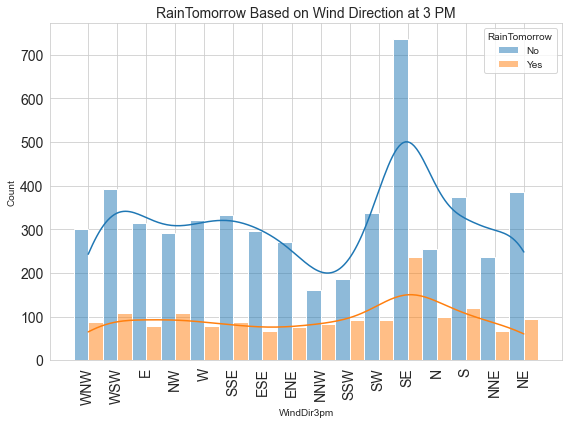

In [89]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindDir3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Direction at 3 PM",fontsize=14)
plt.tight_layout()

Maximum Wind blew through South East and North

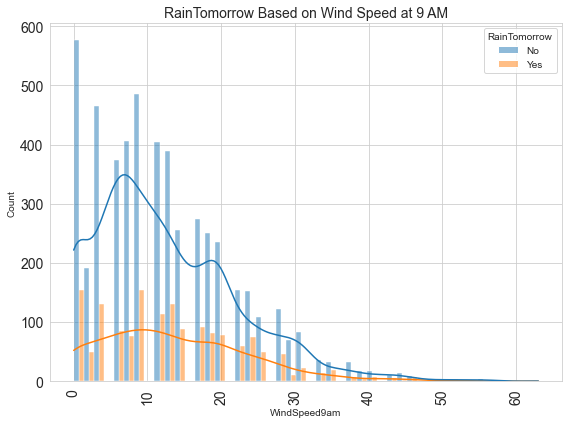

In [90]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindSpeed9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

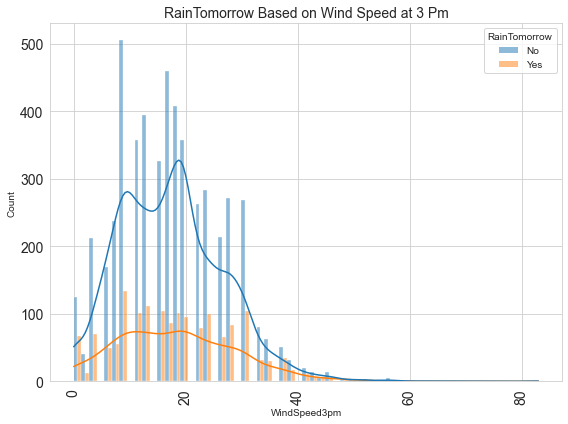

In [91]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindSpeed3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Speed at 3 Pm",fontsize=14)
plt.tight_layout()

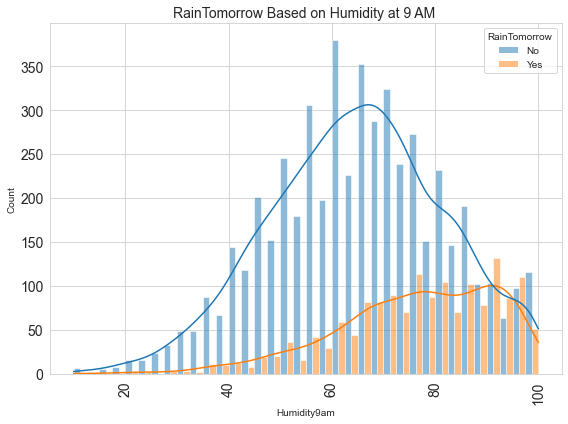

In [92]:
plt.figure(figsize=(8,6))
sns.histplot(x='Humidity9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Humidity at 9 AM ",fontsize=14)
plt.tight_layout()

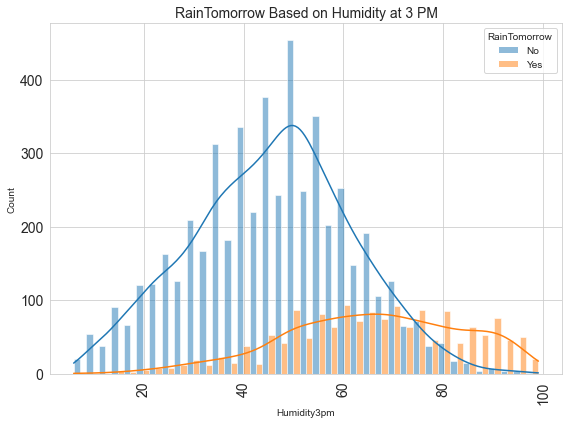

In [93]:
plt.figure(figsize=(8,6))
sns.histplot(x='Humidity3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Humidity at 3 PM",fontsize=14)
plt.tight_layout()

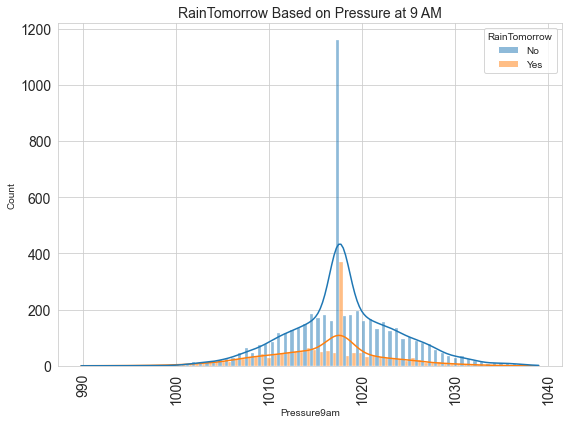

In [94]:
plt.figure(figsize=(8,6))
sns.histplot(x='Pressure9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Pressure at 9 AM",fontsize=14)
plt.tight_layout()

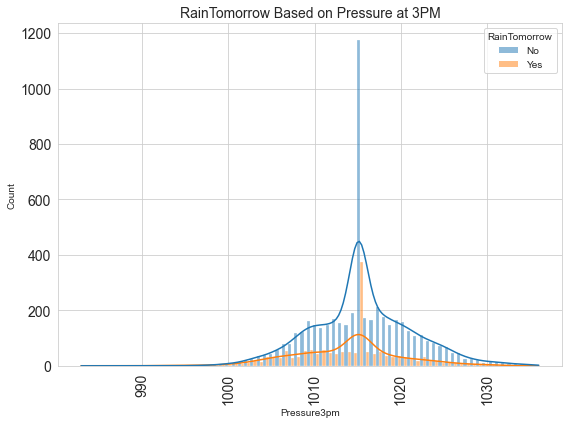

In [95]:
plt.figure(figsize=(8,6))
sns.histplot(x='Pressure3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Pressure at 3PM",fontsize=14)
plt.tight_layout()

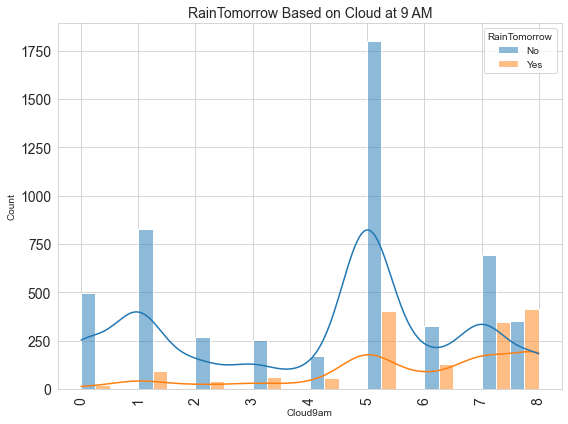

In [96]:
plt.figure(figsize=(8,6))
sns.histplot(x='Cloud9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Cloud at 9 AM",fontsize=14)
plt.tight_layout()

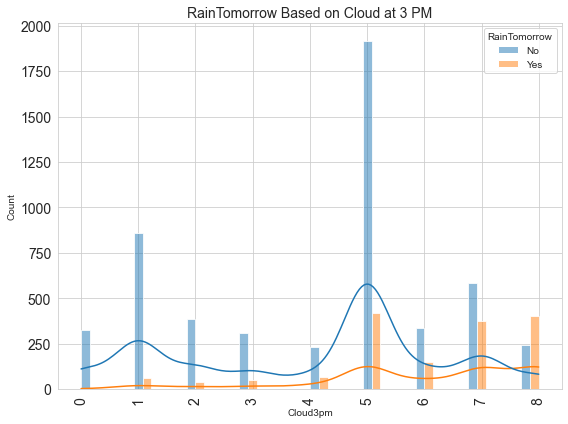

In [97]:
plt.figure(figsize=(8,6))
sns.histplot(x='Cloud3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Cloud at 3 PM",fontsize=14)
plt.tight_layout()

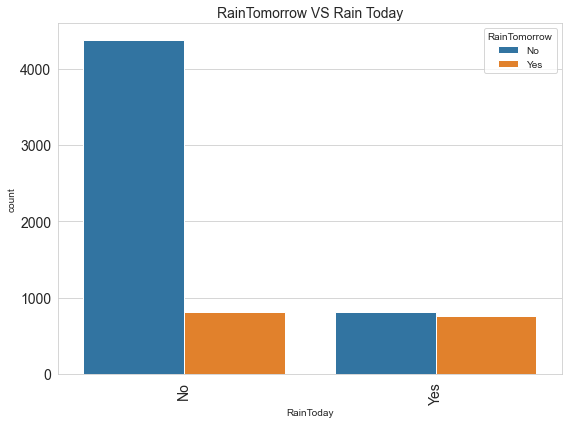

In [98]:
plt.figure(figsize=(8,6))
sns.countplot(x='RainToday',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

In [99]:
inf=df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack()
inf

RainTomorrow,No,Yes
Location,,
Adelaide,160.0,45.0
Albury,708.0,199.0
Brisbane,444.0,135.0
CoffsHarbour,425.0,186.0
Darwin,218.0,32.0
Melbourne,608.0,203.0
Newcastle,624.0,198.0
Penrith,366.0,116.0
PerthAirport,962.0,242.0


Text(0.5, 1.0, 'Chance Of Rain As per Loacation')

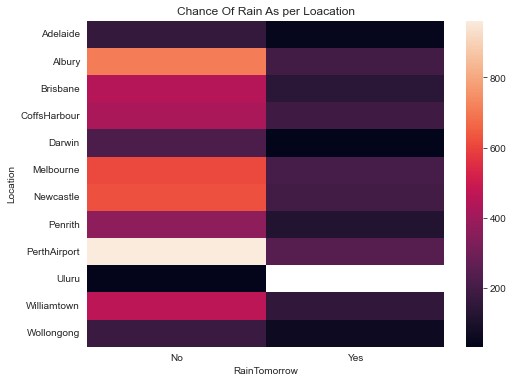

In [100]:
plt.figure(figsize=(8,6))
sns.heatmap(df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack())
plt.title("Chance Of Rain As per Loacation")

# Multivariate Analysis

In [1]:
sns.pairplot(data=df,hue='RainTomorrow')

NameError: name 'sns' is not defined

# Feature Engneering:

In [102]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i,"\n",df[i].unique(),"\n***"*2)

Location 
 ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
***
***
WindGustDir 
 ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'SSW'] 
***
***
WindDir9am 
 ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW'
 'WNW' 'NNE'] 
***
***
WindDir3pm 
 ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' 'NE'] 
***
***
RainToday 
 ['No' 'Yes'] 
***
***
RainTomorrow 
 ['No' 'Yes'] 
***
***


### Taking This under consideration

- North-Northeast Wind = The wind comes from halfway between north and northeast.
- Northeast wind = the wind comes from halfway between North and East.
- East-Northeast Wind = The wind comes from halfway between NorthEast and East.
- East wind = the wind comes from the East.
- East-SouthEast Wind = The wind comes from halfway between southeast and east

so on....

In [103]:
#WindGustDir ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE''ESE' 'SSW']
df['WindGustDir'].replace(['WNW','WSW','NNW','NNE','ENE','SSE','ESE','SSW'],['NW','SW','NW','NE','NE','SE','SE','SW'],inplace=True)

In [104]:
# WindDir9am ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW''WNW' 'NNE'] 
df['WindDir9am'].replace(['NNW','ENE','SSE','SSW','WSW','ESE','WNW','NNE'],['NW','NE','SE','SW','SW','SE','NW','NE'],inplace=True)

In [105]:
#WindDir3pm ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S''NNE' 'NE']
df['WindDir3pm'].replace(["WNW",'WSW','SSE','ESE','ENE','NNW','SSW','NNE'],['NW','SW','SE','SE','NE','NW','SW','NE'],inplace=True)

In [106]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i,"\n",df[i].unique(),"\n***"*1)

Location 
 ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
***
WindGustDir 
 ['W' 'NW' 'SW' 'NE' 'N' 'E' 'SE' 'S'] 
***
WindDir9am 
 ['W' 'NW' 'SE' 'NE' 'SW' 'S' 'N' 'E'] 
***
WindDir3pm 
 ['NW' 'SW' 'E' 'W' 'SE' 'NE' 'N' 'S'] 
***
RainToday 
 ['No' 'Yes'] 
***
RainTomorrow 
 ['No' 'Yes'] 
***


# Label Encoder

In [107]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

for i in df.columns:
    if df[i].dtype=='object':
        df[i]=le.fit_transform(df[i])

In [108]:
df.head(3)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.6,4.6,9.0,7,44.0,7,3,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,1,7.4,25.1,0.0,4.6,9.0,3,44.0,3,6,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,1,12.9,25.7,0.0,4.6,9.0,6,46.0,7,6,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0


# Checking Relationship with Variables

<Figure size 576x432 with 0 Axes>

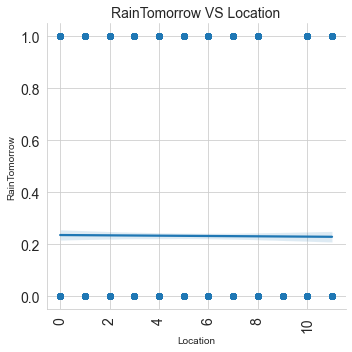

In [110]:
plt.figure(figsize=(8,6))
sns.lmplot(x='Location',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Location",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

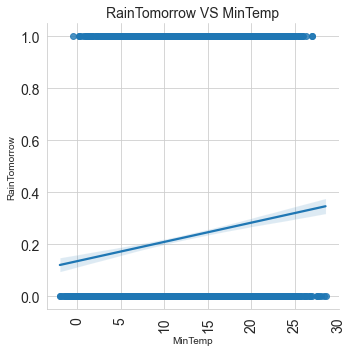

In [111]:
plt.figure(figsize=(8,6))
sns.lmplot(x='MinTemp',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS MinTemp",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

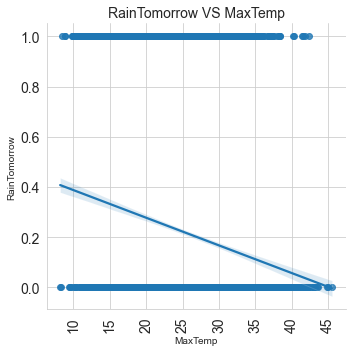

In [112]:
plt.figure(figsize=(8,6))
sns.lmplot(x='MaxTemp',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS MaxTemp",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

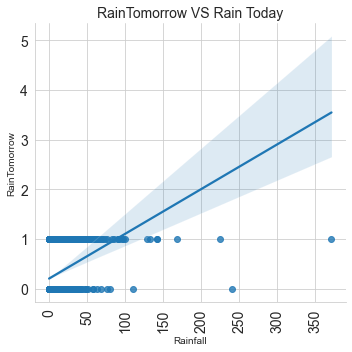

In [113]:
plt.figure(figsize=(8,6))
sns.lmplot(x='Rainfall',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

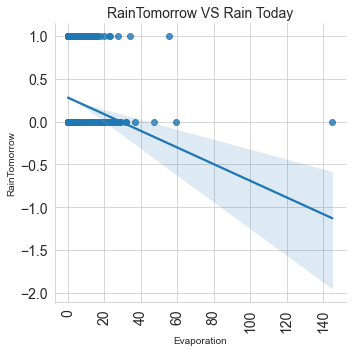

In [114]:
plt.figure(figsize=(8,6))
sns.lmplot(x='Evaporation',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

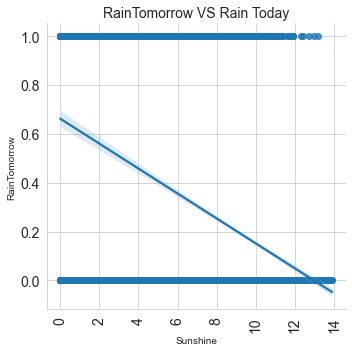

In [115]:
plt.figure(figsize=(8,6))
sns.lmplot(x='Sunshine',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

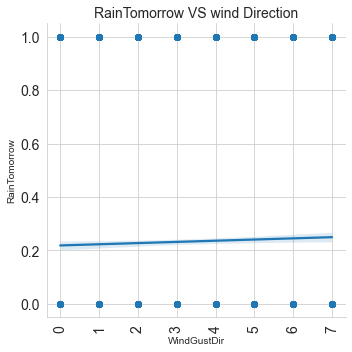

In [116]:
plt.figure(figsize=(8,6))
sns.lmplot(x='WindGustDir',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS wind Direction",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

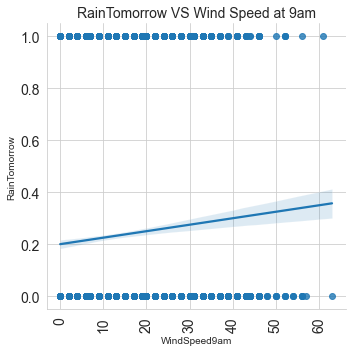

In [117]:
plt.figure(figsize=(8,6))
sns.lmplot(x='WindSpeed9am',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Wind Speed at 9am",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

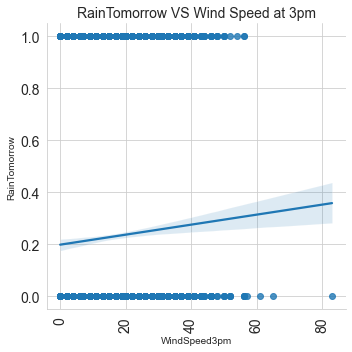

In [118]:
plt.figure(figsize=(8,6))
sns.lmplot(x='WindSpeed3pm',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Wind Speed at 3pm",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

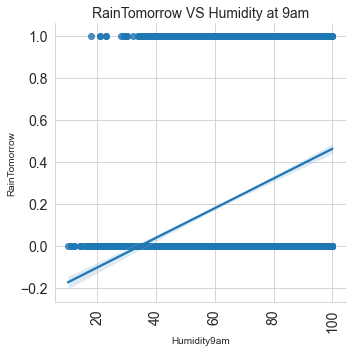

In [119]:
plt.figure(figsize=(8,6))
sns.lmplot(x='Humidity9am',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Humidity at 9am",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

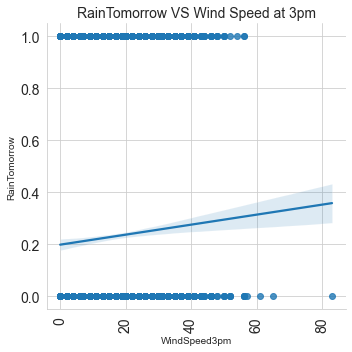

In [120]:
plt.figure(figsize=(8,6))
sns.lmplot(x='WindSpeed3pm',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Wind Speed at 3pm",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

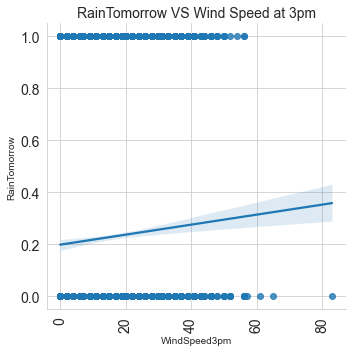

In [121]:
plt.figure(figsize=(8,6))
sns.lmplot(x='WindSpeed3pm',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Wind Speed at 3pm",fontsize=14)
plt.tight_layout()

<Figure size 576x432 with 0 Axes>

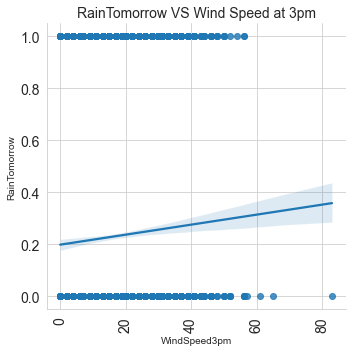

In [122]:
plt.figure(figsize=(8,6))
sns.lmplot(x='WindSpeed3pm',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Wind Speed at 3pm",fontsize=14)
plt.tight_layout()

# Descriptive Statistics

In [123]:
df.describe(include='all')

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,5.323721,13.110086,24.093301,2.723410,4.99898,8.421665,3.218279,38.702159,3.383614,3.916001,12.765602,17.562703,67.510500,50.460515,1017.621222,1015.116060,4.519817,4.511979,17.895830,22.700281,0.232476,0.232476
std,3.099455,5.540674,6.130367,10.490138,3.36177,2.789228,2.360807,13.393977,2.103128,1.928169,9.789075,9.548883,17.182756,18.498424,6.027923,5.967643,2.492344,2.343253,5.722418,5.972262,0.422442,0.422442
min,0.000000,-2.000000,8.200000,0.000000,0.00000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000
25%,2.250000,9.000000,19.600000,0.000000,4.00000,8.800000,1.000000,30.000000,1.000000,2.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000,0.000000,0.000000
50%,6.000000,13.200000,23.500000,0.000000,4.60000,9.000000,3.000000,37.000000,3.000000,4.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000,0.000000,0.000000
75%,8.000000,17.400000,28.400000,0.800000,5.00000,9.200000,5.000000,46.000000,5.000000,5.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,0.000000,0.000000
max,11.000000,28.500000,45.500000,371.000000,145.00000,13.900000,7.000000,107.000000,7.000000,7.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000


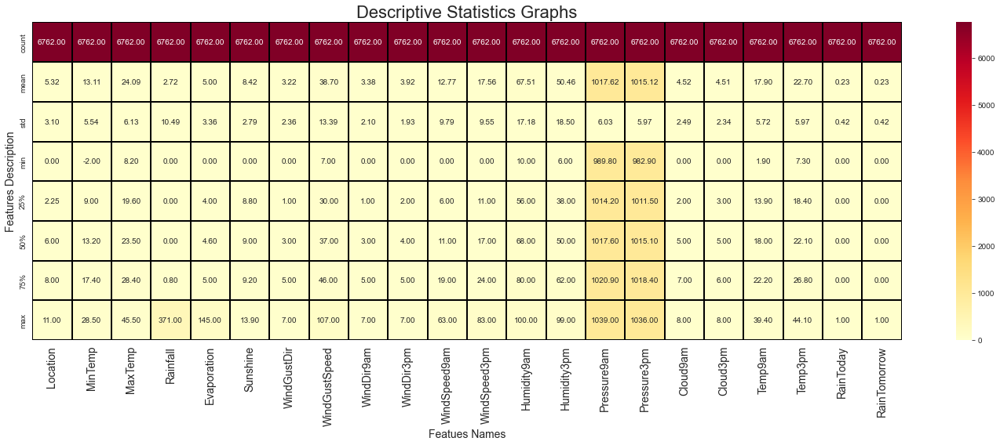

In [124]:
plt.figure(figsize=(20,8))
sns.heatmap(df.describe(),annot=True,linewidth=0.02,linecolor='black',fmt='0.2f',cmap='YlOrRd')
plt.title("Descriptive Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features Description',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.tight_layout()

Few Observation :
----------------------------

- Null Values: No Null Values
- Right Skewed: Nill
- Left Skewed: Nill
- Standard Deviation is more: WindGustSpeed, Rainfall, Humidity9am, Humidity3pm
- Maximum Outliers: Evaporation,Rainfall,WindGustSpeed,WindSpeed9am

# Correlation Graph

In [125]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.090455,0.070761,-0.004972,0.134965,0.068411,-0.092473,0.254955,-0.142647,0.038110,0.239883,0.229565,-0.033586,-0.001569,-0.037942,-0.024722,-0.017268,-0.021092,0.098576,0.066010,-0.004280,-0.004506
MinTemp,0.090455,1.000000,0.728059,0.090971,0.284696,0.001976,-0.092517,0.242823,0.053516,-0.087809,0.168996,0.188485,-0.154218,0.067847,-0.441143,-0.440282,0.073205,0.022233,0.891417,0.696861,0.075902,0.097173
MaxTemp,0.070761,0.728059,1.000000,-0.087604,0.356420,0.323262,-0.150935,0.166300,-0.103593,-0.140212,0.056452,0.115951,-0.425100,-0.430599,-0.337744,-0.413056,-0.247744,-0.246742,0.866654,0.974994,-0.225526,-0.160063
Rainfall,-0.004972,0.090971,-0.087604,1.000000,-0.003746,-0.190464,0.026206,0.086519,0.088440,0.044450,0.050206,0.020421,0.227943,0.243005,-0.071069,-0.032681,0.184536,0.151333,-0.004365,-0.091795,0.461817,0.223599
Evaporation,0.134965,0.284696,0.356420,-0.003746,1.000000,0.251882,-0.060756,0.177502,-0.040372,-0.019005,0.166140,0.137540,-0.269767,-0.195361,-0.202387,-0.217644,-0.093375,-0.135537,0.337970,0.347958,-0.113699,-0.077340
Sunshine,0.068411,0.001976,0.323262,-0.190464,0.251882,1.000000,-0.094539,-0.020876,-0.056948,-0.017840,-0.056071,0.003493,-0.327091,-0.428461,0.003736,-0.050353,-0.488498,-0.515504,0.185468,0.344193,-0.249807,-0.337550
WindGustDir,-0.092473,-0.092517,-0.150935,0.026206,-0.060756,-0.094539,1.000000,-0.025850,0.367536,0.354135,0.044257,0.094725,0.002616,0.020606,-0.040046,0.033506,0.104565,0.059257,-0.107350,-0.158052,0.098456,0.024747
WindGustSpeed,0.254955,0.242823,0.166300,0.086519,0.177502,-0.020876,-0.025850,1.000000,-0.083593,-0.004182,0.603379,0.628393,-0.274375,-0.100244,-0.393348,-0.362226,0.004758,0.042975,0.222317,0.130483,0.085641,0.184400
WindDir9am,-0.142647,0.053516,-0.103593,0.088440,-0.040372,-0.056948,0.367536,-0.083593,1.000000,0.193124,0.058753,0.021184,-0.051146,0.071076,-0.007042,0.059483,0.048805,0.020436,0.010732,-0.105783,0.135672,0.012479
WindDir3pm,0.038110,-0.087809,-0.140212,0.044450,-0.019005,-0.017840,0.354135,-0.004182,0.193124,1.000000,-0.034425,-0.004855,0.018821,0.047421,-0.052612,0.042380,0.055346,0.042125,-0.099082,-0.154662,0.108777,-0.005802


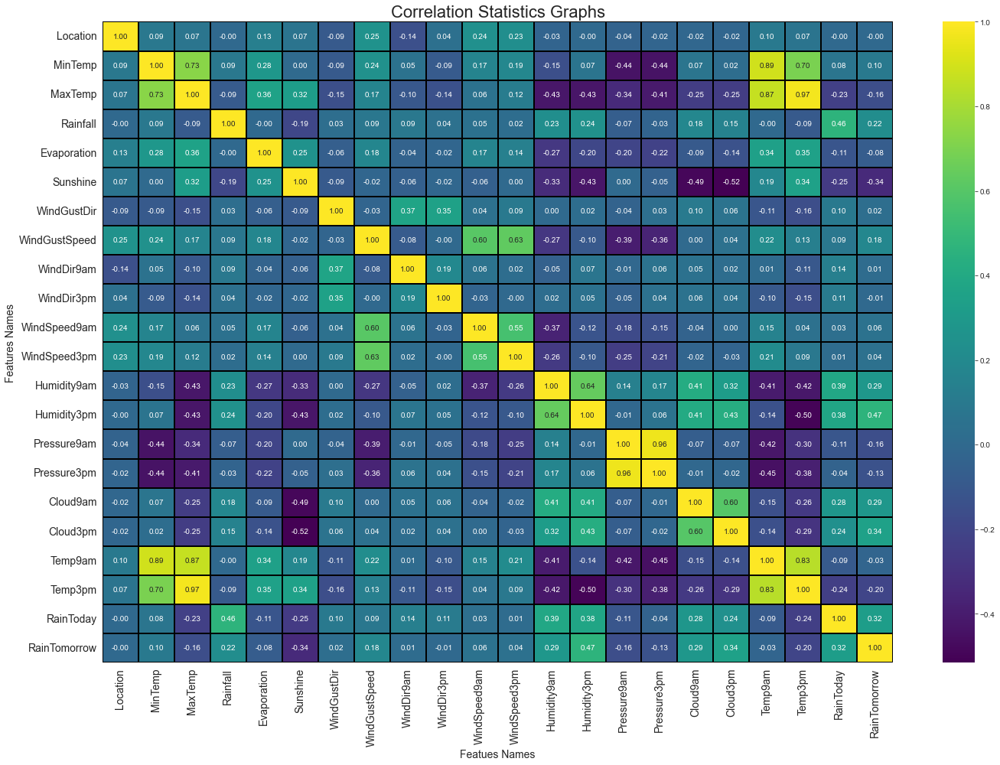

In [126]:
plt.figure(figsize=(20,14))
sns.heatmap(df.corr(),annot=True,linewidth=0.02,linecolor='black',fmt='0.2f',cmap='viridis')
plt.title("Correlation Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features Names',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

# Correlation For " Model Linear Regression"

In [127]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.190464
Temp3pm         -0.091795
MaxTemp         -0.087604
Pressure9am     -0.071069
Pressure3pm     -0.032681
Location        -0.004972
Temp9am         -0.004365
Evaporation     -0.003746
WindSpeed3pm     0.020421
WindGustDir      0.026206
WindDir3pm       0.044450
WindSpeed9am     0.050206
WindGustSpeed    0.086519
WindDir9am       0.088440
MinTemp          0.090971
Cloud3pm         0.151333
Cloud9am         0.184536
RainTomorrow     0.223599
Humidity9am      0.227943
Humidity3pm      0.243005
RainToday        0.461817
Rainfall         1.000000
Name: Rainfall, dtype: float64

## Graph

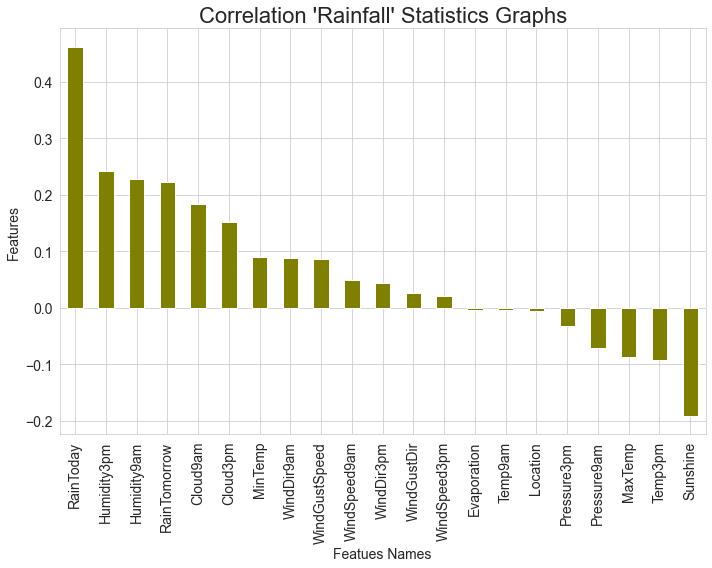

In [128]:
plt.figure(figsize=(10,8))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='olive')
plt.title("Correlation 'Rainfall' Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observation

- Sunshine is 19 percentage Negatively Correlated with the Target Variable.
- Temp3pm  is 9 percentage Negatively Correlated with the Target Variable.
- MaxTemp  is 9 percentage Negatively Correlated with the Target Variable.
- Pressure9am is 7 percentage Negatively Correlated with the Target Variable.
- Pressure3pm  is 3 percentage Negatively Correlated with the Target Variable.
- Location is 1 percentage Negatively Correlated with the Target Variable.
- Temp9am  is 0 percentage Negatively Correlated with the Target Variable.
- Evaporation  is 0 percentage Negatively Correlated with the Target Variable.
- WindSpeed3pm is 2 percentage Positively COrrelated with the target Variable.
- WindGustDir is 3 percentage Positively Correlated with the Target Variable.
- WindDir3pm is 5 percentage Positively Correlated with the Target Variable.
- WindSpeed9am is 5 percentage Positively Correlated with the Target Variable.
- WindGustSpeed is 9 percentage Positively Correlated with the Target Variable.
- WindDir9am is 9 percentage Positively Correlated with the Target Variable.
- MinTemp is 9 percentage Positively Correlated with the Target Variable.  
- Cloud3pm is 15 percentage Positively Correlated with the Target Variable.
- Cloud9am is 18 percentage Positively Correlated with the Target Variable.
- RainTomorrow is 22 percentage Positively Correlated with the Target Variable.
- Humidity9am is 23 percentage Positively Correlated with the Target Variable.
- Humidity3pm is 24 percentage Positively Correlated with the Target Variable.
- RainToday is 46 percentage Positively Correlated with the Target Variable.

# Correlation for " Model Logistic Regression "

In [129]:
df.corr()['RainTomorrow'].sort_values()

Sunshine        -0.337550
Temp3pm         -0.202781
MaxTemp         -0.160063
Pressure9am     -0.159118
Pressure3pm     -0.131771
Evaporation     -0.077340
Temp9am         -0.025768
WindDir3pm      -0.005802
Location        -0.004506
WindDir9am       0.012479
WindGustDir      0.024747
WindSpeed3pm     0.043539
WindSpeed9am     0.057780
MinTemp          0.097173
WindGustSpeed    0.184400
Rainfall         0.223599
Cloud9am         0.285715
Humidity9am      0.287808
RainToday        0.323691
Cloud3pm         0.344434
Humidity3pm      0.466880
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

# Graph Showing Correlation:

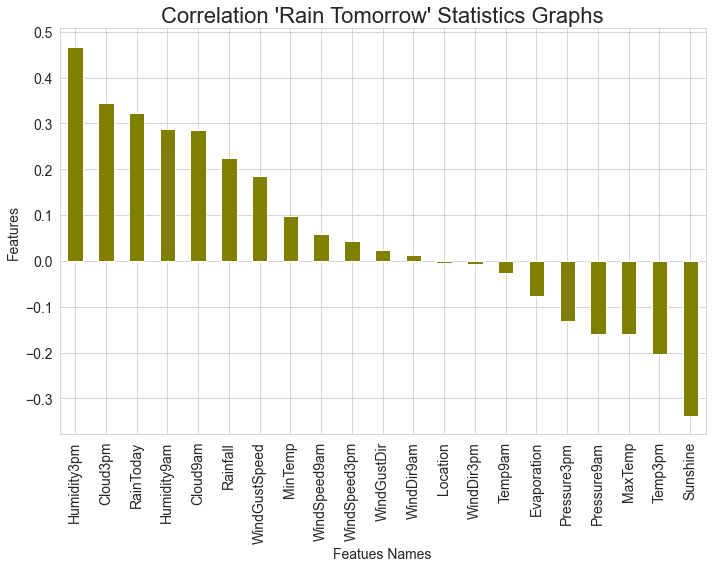

In [130]:
plt.figure(figsize=(10,8))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='olive')
plt.title("Correlation 'Rain Tomorrow' Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observation:

- Sunshine is 34 percentage Negatively Correlated with the Target Variable which is very Week Bond. 
- Temp3pm is 20 percentage Negatively Correlated with the Target Variable Which  is a week Bond.    
- MaxTemp  is 16 percentage Negatively Correlated with the Target Variable which is a week Bond. 
- Pressure9am  is 16 percentage Negatively Correlated with the Target Variable which is a week Bond. 
- Pressure3pm  is 13 percentage Negatively Correlated with the Target Variable which is a week Bond
- Evaporation is 8 percentage Negatively Correlated with the Target Variable which is a week Bond.
- Temp9am is 3 percentage Negatively Correlated with the Target Variable which is a week Bond.
- WindDir3pm is 1 percentage Negatively Correlated with the Target Variable which is a week Bond close to zero.
- Location  is 1 percentage Negatively Correlated with the Target Variable which is a week Bond close to Zero. 
- WindDir9am is 1 percentage Positively Correlated with the Target Variable which is week Bond close to Zero.    
- WindGustDir is 3 percentage Positively Correlated with the Target Variable which is a good Bond but close to zero.
- WindSpeed3pm is 4 percentage Positively Correlated with the Target Variable which is a good Bond but close to zero.     
- WindSpeed9am is 6 percentage Positively Correlated with the Target Variable which is a good Bond. 
- MinTemp is 10 percentage Positively Correlated with the Target Variable which is a good Bond.
- WindGustSpeed is 18  percentage Positively Correlated with the Target Variable which is a very good Bond.
- Rainfall is 22 percentage Positively Correlated with the Target Variable which is very good Bond.
- Cloud9am is 29 percentage Positively Correlated with the Target Variable which is very good Bond.
- Humidity9am is 29 Positively Correlated with the Target Variable which is very good Bond.
- RainToday is 32 Positively Correlated with the Target Variable which is strong Bond-
- Cloud3pm  is 34 Positively Correlated with the Target Variable which is strong Bond
- Humidity3pm is 47 Positively Correlated with the Target Variable which is very strong Bond.

# Checking Outliers

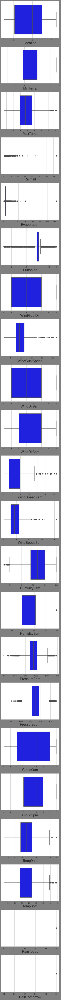

In [131]:
plt.figure(figsize=(5,80),facecolor='grey',edgecolor='black',)

plotnumber=1

for column in df:
    if plotnumber<=22 : 
        sns.set_style('whitegrid')
        ax=plt.subplot(22,1,plotnumber)
        sns.boxplot(df[column],color='blue')
        plt.xlabel(column , fontsize=20)
        
    plotnumber+=1
plt.tight_layout()

### Observation
- Minimum Outliers: MaxTemp,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Temp9am,Temp3pm, RainToday
- Maximum Outliers: Evaporation,Sunshine

- Target Variable:[Rainfall,Rain Tomorrow]

# Skewness:

In [132]:
df.skew().sort_values()

Sunshine         -1.378286
Cloud9am         -0.426084
Cloud3pm         -0.396334
WindDir3pm       -0.335250
Humidity9am      -0.256862
MinTemp          -0.084215
Temp9am          -0.047627
WindGustDir      -0.005012
Location         -0.000009
Pressure9am       0.024619
Pressure3pm       0.044933
WindDir9am        0.118686
Humidity3pm       0.151933
MaxTemp           0.330020
Temp3pm           0.352174
WindSpeed3pm      0.552405
WindGustSpeed     0.838665
WindSpeed9am      0.961630
RainToday         1.266937
RainTomorrow      1.266937
Evaporation      13.603792
Rainfall         13.637400
dtype: float64

Skewness Threshold is taken is(+/-65).
--------------------------------------------

Outcome shows, Column showing skewness are..

- Sunshine         -01.378286
- WindGustSpeed     00.838665
- WindSpeed9am      00.961630
- RainToday         01.266937
- RainTomorrow      01.266937
- Evaporation       13.603792
- Rainfall          13.637400

<AxesSubplot:xlabel='Sunshine', ylabel='Count'>

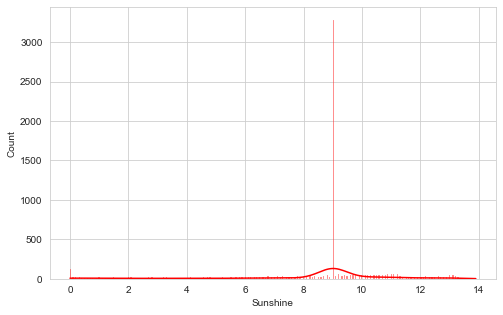

In [133]:
plt.figure(figsize=(8,5))
sns.histplot(df['Sunshine'],color='r',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

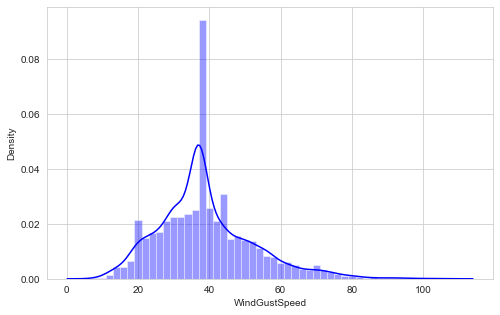

In [134]:
plt.figure(figsize=(8,5))
sns.distplot(df['WindGustSpeed'],color='blue',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

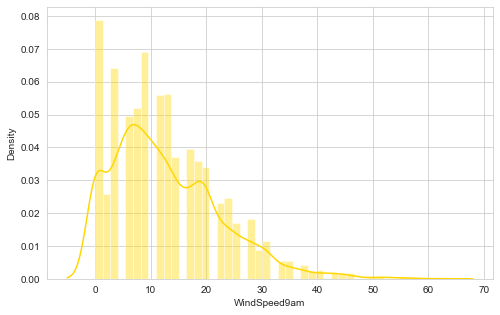

In [135]:
plt.figure(figsize=(8,5))
sns.distplot(df['WindSpeed9am'],color='gold',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='RainToday', ylabel='Density'>

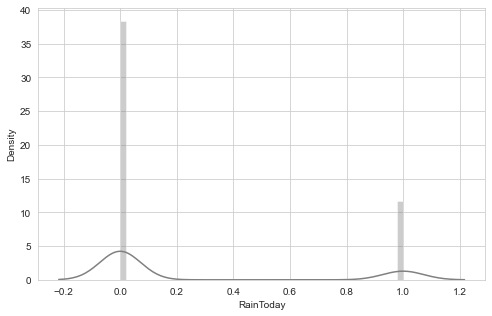

In [136]:
plt.figure(figsize=(8,5))
sns.distplot(df['RainToday'],color='grey',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bimodal)

<AxesSubplot:xlabel='RainTomorrow', ylabel='Density'>

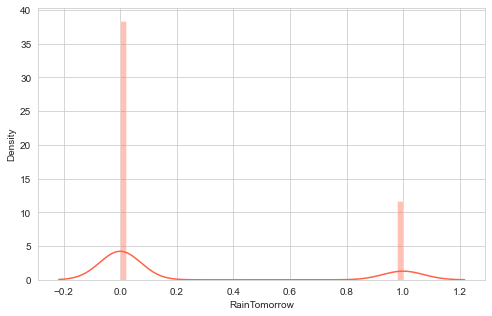

In [137]:
plt.figure(figsize=(8,5))
sns.distplot(df['RainTomorrow'],color='Tomato',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-modal)

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

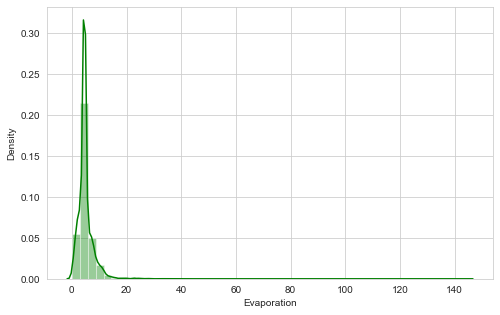

In [138]:
plt.figure(figsize=(8,5))
sns.distplot(df['Evaporation'],color='green',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

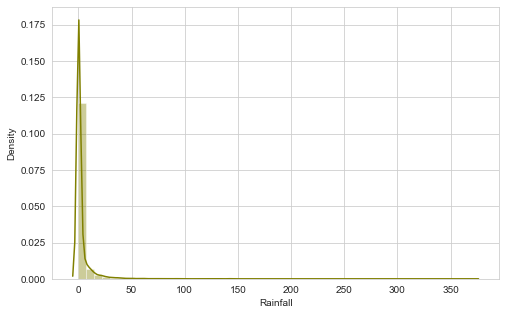

In [139]:
plt.figure(figsize=(8,5))
sns.distplot(df['Rainfall'],color='olive',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

#### Note: "Rainfall" and "Rain Tomorrow" is target Variable In each Cases

# DATA CLEANSING: LINEAR REGRESSION

In [141]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.190464
Temp3pm         -0.091795
MaxTemp         -0.087604
Pressure9am     -0.071069
Pressure3pm     -0.032681
Location        -0.004972
Temp9am         -0.004365
Evaporation     -0.003746
WindSpeed3pm     0.020421
WindGustDir      0.026206
WindDir3pm       0.044450
WindSpeed9am     0.050206
WindGustSpeed    0.086519
WindDir9am       0.088440
MinTemp          0.090971
Cloud3pm         0.151333
Cloud9am         0.184536
RainTomorrow     0.223599
Humidity9am      0.227943
Humidity3pm      0.243005
RainToday        0.461817
Rainfall         1.000000
Name: Rainfall, dtype: float64

### I would delete these columns as:

- Sunshine is very negatively correlated with target variable.
- Location        -0.004972
- Temp9am         -0.004365
- Evaporation     -0.003746


In [142]:
delete=pd.DataFrame(data={"Column_Name":['Sunshine','Location','Temp9am','Evaporation'],
                         "Values":[-0.190464,0.004972,-0.004365,-0.003746],
                         "Outliers":['Yes','No','yes','yes'],
                         "Normalised":['Yes','No','NO','No']})
delete

,Column_Name,Values,Outliers,Normalised
0,Sunshine,-0.190464,Yes,Yes
1,Location,0.004972,No,No
2,Temp9am,-0.004365,yes,NO
3,Evaporation,-0.003746,yes,No


In [144]:
df.drop(['Sunshine','Location','Temp9am','Evaporation'],axis=1,inplace=True)

# Zscore

In [145]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z.head(3)

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,0.052329,0.194668,0.202435,1.601995,0.395568,1.719654,0.475098,0.739082,0.674191,0.203097,1.538651,1.645999,1.343353,1.396453,0.208282,0.150755,0.550355,0.550355
1,1.030652,0.164227,0.259635,0.092466,0.395568,0.182415,1.080897,0.895514,0.464727,1.368362,1.376463,1.164869,1.226045,0.192678,0.208282,0.267878,0.550355,0.550355
2,0.037920,0.262108,0.259635,1.178380,0.544900,1.719654,1.080897,0.636920,0.883655,1.717576,1.106150,1.662590,1.075221,0.192678,1.072084,0.083680,0.550355,0.550355


In [146]:
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  928,  935,  949,  979,  980,
         980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1189, 1202,
        1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480,
        1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680, 1774, 1819,
        1873, 1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108, 2116, 2186,
        2201, 2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500, 2505, 2527,
        2527, 2541, 2593, 2676, 2677, 2735, 2849, 2859, 2890, 2898, 2900,
        2900, 2901, 2909, 3003, 3027, 3051, 3051, 3055, 3058, 3059, 3059,
        3060, 3066, 3067, 3067, 3067, 3068, 3070, 3082, 3082, 3082, 3089,
        3089, 3099, 3099, 3141, 3153, 

In [147]:
z.iloc[8,4]

3.0835422168793576

In [148]:
new_df=df[(z<3).all(axis=1)]

In [149]:
new_df.head()

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,7,44.0,7,3,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,21.8,0,0
1,7.4,25.1,0.0,3,44.0,3,6,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,24.3,0,0
2,12.9,25.7,0.0,6,46.0,7,6,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,23.2,0,0
3,9.2,28.0,0.0,2,24.0,5,0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,26.5,0,0
4,17.5,32.3,1.0,7,41.0,2,3,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,29.7,0,0


# Data Loss Percentage

In [151]:
print("Old Data Frame ",df.shape[0])
print("New_Data Frame ",new_df.shape[0])
print("Data Loss Percentage ",((df.shape[0]-new_df.shape[0])/df.shape[0])*100)

Old Data Frame  6762
New_Data Frame  6459
Data Loss Percentage  4.48092280390417


### However Data Loss percentage is not more than 8 percentage so we will procced with the data set

# Train and Test Seperation:

In [152]:
# y variable
y=new_df.iloc[:,2] 

# x variable
x=new_df.drop(['Rainfall'],axis=1)
x.head(4)

,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,7,44.0,7,3,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,21.8,0,0
1,7.4,25.1,3,44.0,3,6,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,24.3,0,0
2,12.9,25.7,6,46.0,7,6,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,23.2,0,0
3,9.2,28.0,2,24.0,5,0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,26.5,0,0


In [153]:
y.head(4)

0    0.6
1    0.0
2    0.0
3    0.0
Name: Rainfall, dtype: float64

In [154]:
print("Present Size of X Data ",x.shape,"And present Size of Y Data ",y.shape)

Present Size of X Data  (6459, 17) And present Size of Y Data  (6459,)


In [155]:
x.columns

Index(['MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

# Removing Skewness

In [156]:
from sklearn.preprocessing import QuantileTransformer
qt=QuantileTransformer()
x=qt.fit_transform(x)

In [157]:
x=pd.DataFrame(data=x,columns=['MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp3pm', 'RainToday', 'RainTomorrow'])

In [158]:
x.skew()

MinTemp         -0.000064
MaxTemp          0.000014
WindGustDir     -0.164418
WindGustSpeed    0.000011
WindDir9am      -0.002417
WindDir3pm      -0.023410
WindSpeed9am    -0.086125
WindSpeed3pm    -0.005560
Humidity9am     -0.000303
Humidity3pm     -0.000270
Pressure9am      0.000656
Pressure3pm      0.000694
Cloud9am         0.031507
Cloud3pm         0.038832
Temp3pm          0.000155
RainToday        1.339133
RainTomorrow     1.333746
dtype: float64

In [159]:
df.drop(['RainTomorrow','RainToday'],axis=1,inplace=True)

# Standard Scaler(Standardization)

In [160]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

x=scaler.fit_transform(x)

In [161]:
x

array([[ 0.09005109, -0.15770809,  1.61807935, ..., -0.11607626,
        -0.53396385, -0.53516085],
       [-1.14072331,  0.32075311,  0.02498233, ...,  0.45601583,
        -0.53396385, -0.53516085],
       [-0.05729514,  0.43863486,  1.14449788, ...,  0.227179  ,
        -0.53396385, -0.53516085],
       ...,
       [-1.41461395,  0.64666147, -0.71256259, ...,  0.77326691,
        -0.53396385, -0.53516085],
       [-1.07658436,  0.66399703,  0.63365098, ...,  0.75419717,
        -0.53396385, -0.53516085],
       [ 0.39687794, -0.00862236, -1.48426748, ..., -0.32410975,
        -0.53396385, -0.53516085]])

In [162]:
print("Mean ",round(x.mean()))
print("Standard Deviation ",round(x.std()))

Mean  0
Standard Deviation  1


In [163]:
x=pd.DataFrame(data=x,columns=['MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp3pm', 'RainToday', 'RainTomorrow'])

# Checking Multicolinarity

In [164]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(x):
    vif=pd.DataFrame()
    vif['Variable']=x.columns
    vif['VIF Factors']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return vif
calc_vif(x)

,Variable,VIF Factors
0,MinTemp,4.898078
1,MaxTemp,24.167779
2,WindGustDir,1.370966
3,WindGustSpeed,2.288598
4,WindDir9am,1.290254
5,WindDir3pm,1.229131
6,WindSpeed9am,1.924006
7,WindSpeed3pm,1.997450
8,Humidity9am,2.481003
9,Humidity3pm,3.256695


In [165]:
x.drop(['MaxTemp','Pressure3pm'],inplace=True,axis=1)

# Principle Component Analysis

In [166]:
from sklearn.decomposition import PCA
pca=PCA(n_components=8)

x=pca.fit_transform(x)

# Target Variable

In [167]:
y.unique()

array([ 0.6,  0. ,  1. ,  0.2,  1.4,  2.2,  3.6, 16.8, 10.6,  1.2,  0.8,
        6.4,  0.4,  3. ,  5.8, 11.6,  1.8, 12.6,  8.4,  6.2, 20. , 21. ,
        3.2,  4.8,  4.2,  8. , 14.4,  4.6,  2. ,  5.6,  1.6,  6. ,  4.4,
        5.4,  5. ,  7.8,  6.8,  9.8,  3.8,  2.4,  5.2,  6.6, 13.4, 10.2,
        7. , 25.8,  9.4, 12.4,  8.6, 20.6, 11. , 17. , 10.4, 28. , 21.4,
       18.6,  7.2,  8.2, 10.8, 15.4,  9.6,  4. , 21.8, 20.8, 24.8, 10. ,
       11.4, 19. , 32.8,  3.4, 19.2, 18.8, 14.8, 12. , 18.4, 25.6, 14.2,
       13.8, 28.2, 12.2, 12.8, 11.8, 19.8, 17.4,  8.8,  2.6, 24.4,  7.4,
       15.6,  9.2, 21.2, 11.2, 29.8, 20.2, 19.6,  2.8, 13.6, 15.2,  9. ,
       29.4, 13.2, 24. , 18.2, 33.4,  7.6, 16.2, 13. , 23.8, 27.6, 15.8,
       30.8, 14.6, 20.4, 15. , 23. , 31.1, 27.8, 15.7,  0.5,  0.1, 26. ,
       22.5, 33.8, 17.2, 22.8,  0.7,  1.5, 31.4, 32.4,  6.3, 17.6, 30. ,
       27.2, 23.4, 16.4, 26.4, 25. , 30.2, 25.2,  8.7,  2.1,  1.9,  5.5,
        2.3,  2.5,  2.9, 28.4, 16. , 33. , 19.4, 23

### Continious Values we will use Linear Model

# Linear Regression

In [168]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

In [169]:
for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.2)
    lr.fit(x_train,y_train)
    
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    
    if round(r2_score(y_train,pred_train),2)==round(r2_score(y_test,pred_test),3):
        print(f"At random State {i},The r2 train score {r2_score(y_train,pred_train)}, r2 test score {r2_score(y_test,pred_test)}")

At random State 44,The r2 train score 0.4619557373074381, r2 test score 0.46040101804459277


In [171]:
# Train Test
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=44,test_size=0.2)

#training 
lr.fit(x_train,y_train)
lr_score=lr.score(x_train,y_train)

#predict
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train)*100,"Testing Accuracy R2_score ",r2_score(y_test,pred_test)*100)
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  46.19557373074381 Testing Accuracy R2_score  46.040101804459276
Training Mean_squared_Error  12.03137718630735 Testing Mean_squared_error  12.570363065348097
Training Absolute_Error  1.9181378468600343 Testing Absolute Error 1.9949348337343906


In [172]:
print("Coefficient ",lr.coef_," Intercept ",lr.intercept_)

Coefficient  [ 0.92426728  0.92502897 -0.03343204 -0.34270463  0.60356812  1.77806787
 -1.24355027  1.16146364]  Intercept  1.8515914649674428


# Model Cross Validation

In [173]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    lr_cv_score=cross_val_score(lr,x,y,cv=i)
    cv_mean=lr_cv_score.mean()

    print(f"At CROSS_FOLD {i}, Cross_Val_Mean {cv_mean} ,Training Score is {train_accuracy}, Testing Score {test_accuracy}")

At CROSS_FOLD 2, Cross_Val_Mean 0.45252458926040157 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 3, Cross_Val_Mean 0.4555770712977127 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 4, Cross_Val_Mean 0.4553688875352231 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 5, Cross_Val_Mean 0.45293223723168763 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 6, Cross_Val_Mean 0.4536616817516635 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 7, Cross_Val_Mean 0.45616449842817414 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 8, Cross_Val_Mean 0.45655937419898884 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277
At CROSS_FOLD 9, Cross_Val_Mean 0.45187448080696846 ,Training Score is 0.4619557373074381, Testing Score 0.46040101804459277


#### Selected Cross Fold 8 is close cvscore is close Testing Score

In [174]:
# pred training for linear regression
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with linear regression
lr_cv_score=cross_val_score(lr,x,y,cv=8) 
lr_mean=lr_cv_score.mean() #mean value

print("Cv_score of Model is ",lr_mean,"The Training Score is ", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.45655937419898884 The Training Score is  0.4619557373074381 Testing Score Stands  0.46040101804459277


### Linear Regression Graph Model

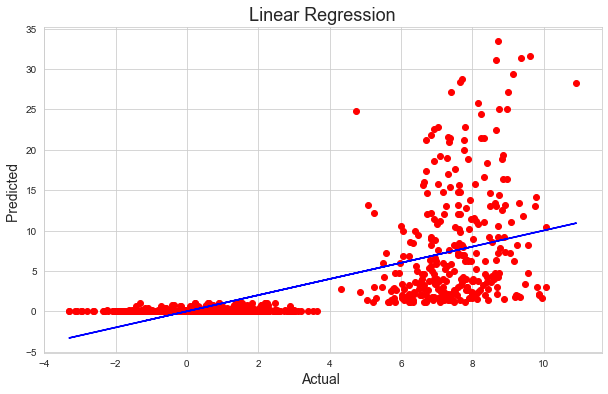

In [175]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='r')
plt.plot(pred_test,pred_test,color='b')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Regularization

In [176]:
from sklearn.linear_model import ElasticNet
# Elastic Net Model
en=ElasticNet()
en.fit(x_train,y_train)

# training score
en_score_training=en.score(x_train,y_train)
en_score_training*100

32.82585287512012

In [177]:
pred_en=en.predict(x_test) # predict test

en_cv_score=cross_val_score(en,x,y,cv=5)
en_cv_mean=en_cv_score.mean()
en_cv_mean*100

32.65657473787779

#### Working With Other Models
# Model- Decision Tree Regressor

In [178]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()

#training Dtc model
dtr.fit(x_train,y_train)
dtr_score=dtr.score(x_train,y_train)

#predict dtc
pred_train=dtr.predict(x_train)
pred_test=dtr.predict(x_test)

#result dtc
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.9990774768615555 Testing Accuracy R2_score  -0.04767911309232553
Training Mean_squared_Error  0.020628830398038835 Testing Mean_squared_error  24.406470856983145
Training Absolute_Error  0.0028611057351138644 Testing Absolute Error 1.8512706398348813


## Cross Validation_Model

In [179]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    dtr_cv_score=cross_val_score(dtr,x,y,cv=i)
    cv_mean=dtr_cv_score.mean()

    print(f"At CROSS_FOLD{i}, Cross_Val_Score {cv_mean} Training Score{train_accuracy} Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score -0.03987787539629645 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD3, Cross_Val_Score -0.059602129855235754 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD4, Cross_Val_Score -0.06781563084202011 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD5, Cross_Val_Score -0.07103441379594552 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD6, Cross_Val_Score -0.04688929383498127 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD7, Cross_Val_Score -0.0018515407904003492 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD8, Cross_Val_Score -0.0016847577466377467 Training Score0.9990774768615555 Testing Score-0.04767911309232553
At CROSS_FOLD9, Cross_Val_Score -0.06413554060028251 Training Score0.9990774768615555 Testing Score-0.04767911309232553


### Selected Cross Fold 2 is close cv_score is close Testing Score

In [180]:
#cross val with dtc
dtr_cv_score=cross_val_score(dtr,x,y,cv=2) 
dtr_mean=dtr_cv_score.mean() #mean value

print("CV_score",dtr_mean,"Training Score is ", train_accuracy," Testing Score Stands " ,test_accuracy)

CV_score -0.05151124937783824 Training Score is  0.9990774768615555  Testing Score Stands  -0.04767911309232553


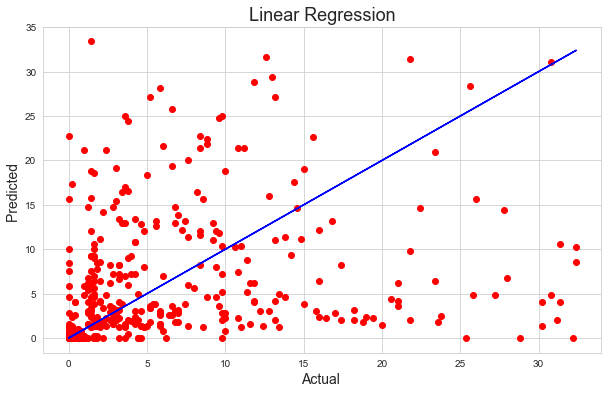

In [181]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='r')
plt.plot(pred_test,pred_test,color='b')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# KNeighbors Regressor

In [182]:
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor()

#training knr model
knr.fit(x_train,y_train)
knr_score=knr.score(x_train,y_train)

#predict knr
pred_train=knr.predict(x_train)
pred_test=knr.predict(x_test)

#result knr
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.6136120476515387 Testing Accuracy R2_score  0.4081389138247986
Training Mean_squared_Error  8.640142674666151 Testing Mean_squared_error  13.7878479876161
Training Absolute_Error  1.099543255273853 Testing Absolute Error 1.4241331269349846


## Cross Validation_Model

In [183]:
#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    knr_cv_score=cross_val_score(knr,x,y,cv=i)
    cv_mean=knr_cv_score.mean()

    print(f"At CROSS_FOLD {i},The Cross_Val_Mean {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD 2,The Cross_Val_Mean 0.4167188037456572 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 3,The Cross_Val_Mean 0.3835821852479932 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 4,The Cross_Val_Mean 0.4140859340344072 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 5,The Cross_Val_Mean 0.40964710766779894 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 6,The Cross_Val_Mean 0.4060458732148596 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 7,The Cross_Val_Mean 0.40875882405682457 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 8,The Cross_Val_Mean 0.4058523750179789 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986
At CROSS_FOLD 9,The Cross_Val_Mean 0.4046835225006559 ,Training Score is 0.6136120476515387,Testing Score0.4081389138247986


### Selected Cross Fold 8 is close cv_score is close Testing Score

In [184]:
#cross val with k-Neighbors
knr_cv_score=cross_val_score(knr,x,y,cv=8) 
knr_mean=knr_cv_score.mean() #mean value

print("Cv_score of Model is ",knr_mean," The Training Score", train_accuracy," Testing Score Stands" ,test_accuracy)

Cv_score of Model is  0.4058523750179789  The Training Score 0.6136120476515387  Testing Score Stands 0.4081389138247986


### Graph

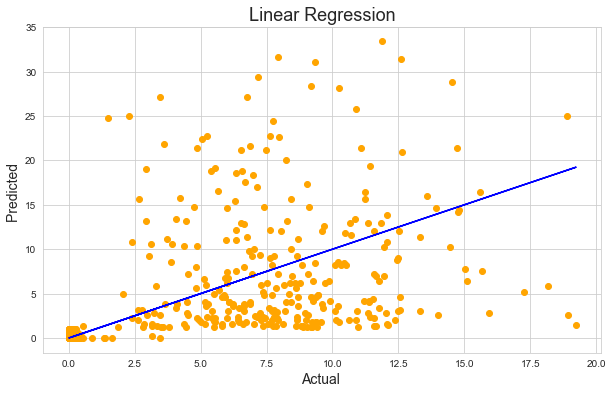

In [185]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orange')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

## Model 3 Support vector Machine

In [186]:
from sklearn.svm import SVR
svr=SVR()

#training SVR
svr.fit(x_train,y_train)
svr_score=svr.score(x_train,y_train)

#predict SVR
pred_train = svr.predict(x_train)
pred_test  = svr.predict(x_test)

#result SVR
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.44837568978026354 Testing Accuracy R2_score  0.4414242697162476
Training Mean_squared_Error  12.335044905371529 Testing Mean_squared_error  13.012440653082963
Training Absolute_Error  1.1867336760276408 Testing Absolute Error 1.26574741043659


### Model Cross_Validation

In [187]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    svr_cv_score=cross_val_score(svr,x,y,cv=i)
    cv_mean=svr_cv_score.mean()

    print(f"CROSS_FOLD{i},Cross_Val_Score{cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy} ")

CROSS_FOLD2,Cross_Val_Score0.3962327315472276 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD3,Cross_Val_Score0.411918327784289 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD4,Cross_Val_Score0.42570953472954337 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD5,Cross_Val_Score0.42275204131801025 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD6,Cross_Val_Score0.4259032018667524 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD7,Cross_Val_Score0.4316325513246263 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD8,Cross_Val_Score0.42858316836239696 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 
CROSS_FOLD9,Cross_Val_Score0.42703728336592206 ,Training Score is 0.44837568978026354,Testing Score0.4414242697162476 


### Selected Cross Fold 8 is close cv_score is close Testing Score

In [188]:
svr_cv_score=cross_val_score(svr,x,y,cv=8) 
svr_mean=svr_cv_score.mean() # cross val mean

print("Cv_score of Model is ",svr_mean," The Training Score is ",train_accuracy," Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.42858316836239696  The Training Score is  0.44837568978026354  Testing Score Stands  0.4414242697162476


### Model Graph

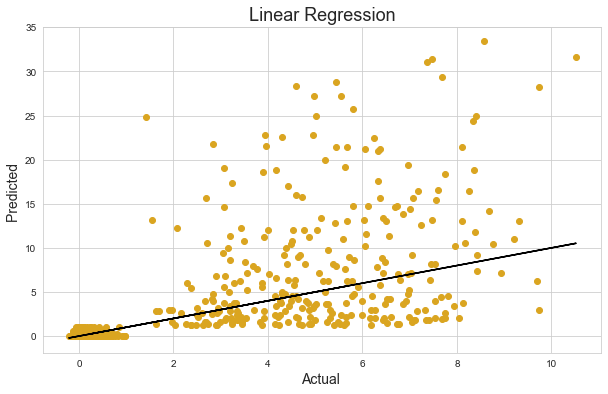

In [189]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='goldenrod')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# SGD Regressor

In [190]:
from sklearn.linear_model import SGDRegressor
sgd=SGDRegressor()

#training SGD
sgd.fit(x_train,y_train)
sgd_score=sgd.score(x_train,y_train)

#predict
pred_train=sgd.predict(x_train)
pred_test=sgd.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.4612558980351694 Testing Accuracy R2_score  0.45992181475483707
Training Mean_squared_Error  12.047026512651467 Testing Mean_squared_error  12.581526465457767
Training Absolute_Error  1.9031766400523715 Testing Absolute Error 1.981084308952226


## Cross Validation_Model

In [191]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    sgd_cv_score=cross_val_score(sgd,x,y,cv=i)
    cv_mean=sgd_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.44942014741215813 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD3, The Cross_Val_Score 0.4522136078953211 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD4, The Cross_Val_Score 0.45419044056666397 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD5, The Cross_Val_Score 0.45275831143863154 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD6, The Cross_Val_Score 0.4525630086897589 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD7, The Cross_Val_Score 0.4546335520494896 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD8, The Cross_Val_Score 0.4541288737656298 ,Training Score is 0.4612558980351694,Testing Score0.45992181475483707
At CROSS_FOLD9, The Cross_Val_Score 0.4518719146858743 ,Training Score is 0.4612558980351694,Testing Score0.4599218

### Selected Cross Fold 8 is close cv_score is close Testing Score

In [192]:
# pred training for SGD Regressor
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with SGD Regressor
sgd_cv_score=cross_val_score(sgd,x,y,cv=8) 
sgd_mean=sgd_cv_score.mean() #mean value

print("Cv_score of Model is ",sgd_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.4543463110553281  The Training Score is 0.4612558980351694 Testing Score Stands  0.45992181475483707


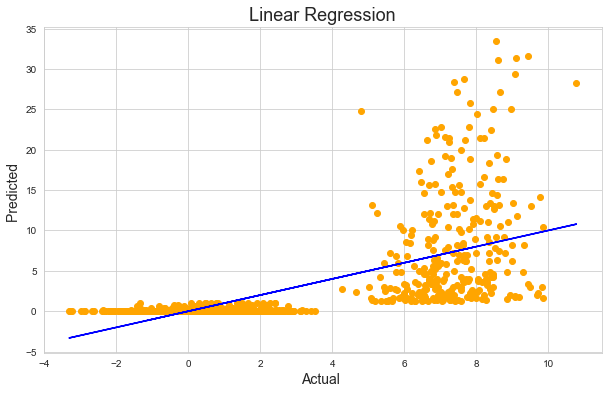

In [193]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orange')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()


# Ensemble Techniques (Bagging)

## Extra Trees Regressor

In [194]:
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()

#training score
etr.fit(x_train,y_train)
etr_score=etr.score(x_train,y_train)

#predict
pred_train=etr.predict(x_train)
pred_test=etr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.9990774768615555 Testing Accuracy R2_score  0.5053011176688813
Training Mean_squared_Error  0.020628830398038835 Testing Mean_squared_error  11.524381562747246
Training Absolute_Error  0.0028611057351159413 Testing Absolute Error 1.4144107327141382


### Model Cross Validation

In [195]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    etr_cv_score=cross_val_score(etr,x,y,cv=i)
    cv_mean=etr_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.4686148450577859 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD3, The Cross_Val_Score 0.45995841204617655 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD4, The Cross_Val_Score 0.47727005904326686 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD5, The Cross_Val_Score 0.46704147623529374 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD6, The Cross_Val_Score 0.4695478845655292 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD7, The Cross_Val_Score 0.4752563413888008 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD8, The Cross_Val_Score 0.47452475955002726 ,Training Score is 0.9990774768615555,Testing Score0.5053011176688813
At CROSS_FOLD9, The Cross_Val_Score 0.46181098820957467 ,Training Score is 0.9990774768615555,Testing Score0.505301117668

### As this Cross Fold 9 Cross Val Score is near to Training score.

In [196]:
# pred training for Extra Trees
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Extra Trees
etr_cv_score=cross_val_score(etr,x,y,cv=9) 
etr_mean=etr_cv_score.mean() #mean value

print("Cv_score of Model is ",etr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.46190503081677864  The Training Score is 0.9990774768615555 Testing Score Stands  0.5053011176688813


### Graph Showing

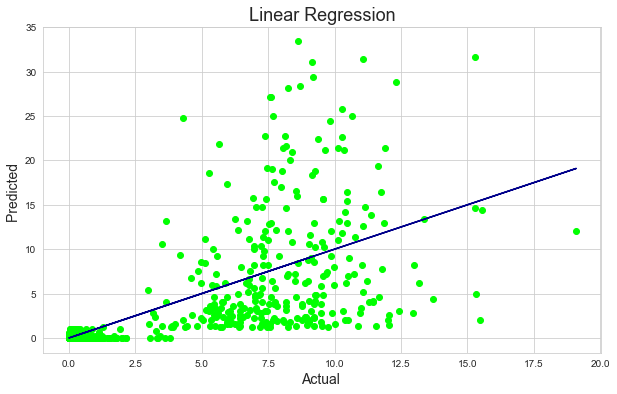

In [197]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='lime')
plt.plot(pred_test,pred_test,color='darkblue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Random Forest Regressor

In [198]:
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor()

#training Random Forest
rfr.fit(x_train,y_train)
rfr_score= rfr.score(x_train,y_train)

#predict Model
pred_train = rfr.predict(x_train)
pred_test = rfr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.9235815971384427 Testing Accuracy R2_score  0.48503054386596567
Training Mean_squared_Error  1.708815970272581 Testing Mean_squared_error  11.996599785476658
Training Absolute_Error  0.5238682897337681 Testing Absolute Error 1.4508541025579622


### Model Cross Validation

In [199]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    rfr_cv_score=cross_val_score(rfr,x,y,cv=i)
    cv_mean=rfr_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.4463125634452213 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD3, The Cross_Val_Score 0.43887850756510355 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD4, The Cross_Val_Score 0.46428118493357473 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD5, The Cross_Val_Score 0.4542406734007679 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD6, The Cross_Val_Score 0.4573453540489962 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD7, The Cross_Val_Score 0.4623336774050797 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD8, The Cross_Val_Score 0.47458677312404063 ,Training Score is 0.9235815971384427,Testing Score0.48503054386596567
At CROSS_FOLD9, The Cross_Val_Score 0.4569021374779936 ,Training Score is 0.9235815971384427,Testing Score0.4850305

### Selected Cross Fold 8 Cross_Val_Score is near to training score

In [200]:
# pred training for Random Forest
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Random Forest
rfr_cv_score=cross_val_score(rfr,x,y,cv=8) 
rfr_mean=rfr_cv_score.mean()

print("Cv_score of Model is ",rfr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.4669769351477709  The Training Score is 0.9235815971384427 Testing Score Stands  0.48503054386596567


### Graph Ploting for Random Forest Regressor

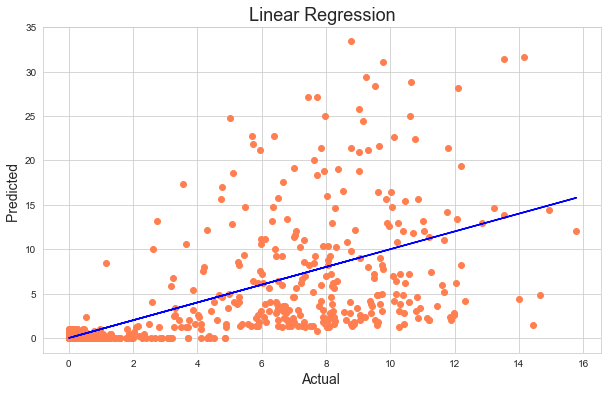

In [201]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='coral')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

## Ensemble Techniques (Boosting )
# Ada Boost

In [202]:
from sklearn.ensemble import AdaBoostRegressor
ada=AdaBoostRegressor()

#training_ada_Boost
ada.fit(x_train,y_train)
ada_score= ada.score(x_train,y_train)

#predict_ada_Boost
pred_train = ada.predict(x_train)
pred_test = ada.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.33368787415075374 Testing Accuracy R2_score  0.2661344750385244
Training Mean_squared_Error  14.89961526545128 Testing Mean_squared_error  17.09594791390911
Training Absolute_Error  2.073310288459864 Testing Absolute Error 2.23621982153473


## Cross Validation_Model

In [203]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    ada_cv_score=cross_val_score(ada,x,y,cv=i)
    cv_mean=ada_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.27373646052075656 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD3, The Cross_Val_Score 0.21824425546326295 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD4, The Cross_Val_Score 0.2862195143996069 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD5, The Cross_Val_Score 0.25924523860525894 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD6, The Cross_Val_Score 0.2548771837092569 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD7, The Cross_Val_Score 0.26385574978693704 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD8, The Cross_Val_Score 0.2610436657603067 ,Training Score is 0.33368787415075374,Testing Score0.2661344750385244
At CROSS_FOLD9, The Cross_Val_Score 0.22170820761834634 ,Training Score is 0.33368787415075374,Testing Score0.2661

### As this Cross Fold 4 Cross_Val_Score is near to Training score

In [204]:
# pred training for Ada Boost
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Ada Boost
ada_cv_score=cross_val_score(ada,x,y,cv=4) 
ada_mean=ada_cv_score.mean() # mean value

print("Cv_score of Model is ",ada_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.2684823166279051  The Training Score is 0.33368787415075374 Testing Score Stands  0.2661344750385244


### Graph

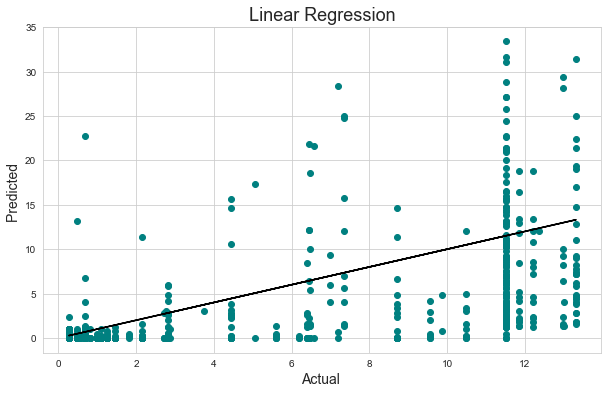

In [205]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='teal')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Gradient Boost

In [206]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()

#training_Gradient_Boost
gbr.fit(x_train,y_train)
gbr_score= gbr.score(x_train,y_train)

#predict_gbr
pred_train = gbr.predict(x_train)
pred_test = gbr.predict(x_test)

#result_gbr
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.6480075771106355 Testing Accuracy R2_score  0.47827253301569694
Training Mean_squared_Error  7.871013409400482 Testing Mean_squared_error  12.154032717762028
Training Absolute_Error  1.2855077901971914 Testing Absolute Error 1.6085036179773973


## Cross Validation_Model

In [207]:
from sklearn.model_selection import cross_val_score

# testing
train_accuracy=r2_score(y_train,pred_train)
test_accuracy =r2_score(y_test,pred_test)

#cross validation
for i in range(2,10):
    gbr_cv_score=cross_val_score(gbr,x,y,cv=i)
    cv_mean=gbr_cv_score.mean()
    
    print(f"At CROSS_FOLD{i}, Cross_Val_Score is {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score is 0.41440273319338966 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD3, Cross_Val_Score is 0.43599878737932524 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD4, Cross_Val_Score is 0.43866237192451774 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD5, Cross_Val_Score is 0.4438810518918464 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD6, Cross_Val_Score is 0.43976510530120355 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD7, Cross_Val_Score is 0.45159339023382566 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD8, Cross_Val_Score is 0.452377061185262 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569694
At CROSS_FOLD9, Cross_Val_Score is 0.4390074485538954 ,Training Score is 0.6480075771106355,Testing Score0.47827253301569

### Selected Model Cross Fold 7 Cross_val_score is near to Training score

In [208]:
# pred training for Gradient Boost
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Gradient Boost
gbr_cv_score=cross_val_score(gbr,x,y,cv=7) 
gbr_mean=gbr_cv_score.mean() # mean value

print("Cv_score of Model is ",gbr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.4520377516781383  The Training Score is 0.6480075771106355 Testing Score Stands  0.47827253301569694


### Graph 

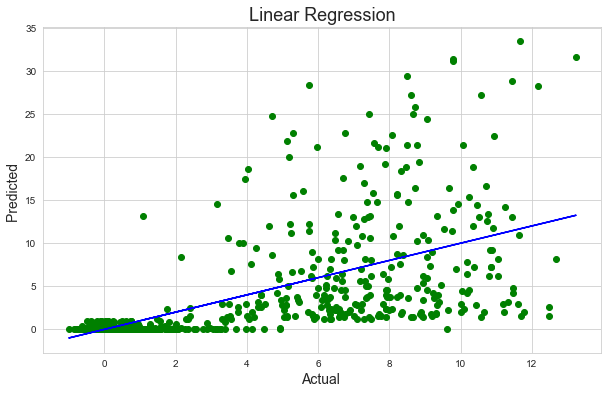

In [209]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='green')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Neural Network (MLPRegressor)

In [210]:
from sklearn.neural_network import MLPRegressor
mlp= MLPRegressor()

#training
#training_mlp
mlp.fit(x_train,y_train)
mlp_score= mlp.score(x_train,y_train)

#predict_mlp
pred_train = mlp.predict(x_train)
pred_test = mlp.predict(x_test)

#result_mlp
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.5563979181347705 Testing Accuracy R2_score  0.5338125502444555
Training Mean_squared_Error  9.919525841318018 Testing Mean_squared_error  10.860186353020591
Training Absolute_Error  1.3319324434080448 Testing Absolute Error 1.437836118035643


## Model Cross Validation

In [211]:
from sklearn.model_selection import cross_val_score

# testing
train_accuracy=r2_score(y_train,pred_train)
test_accuracy =r2_score(y_test,pred_test)

#cross validation
for i in range(2,10):
    mlp_cv_score=cross_val_score(mlp,x,y,cv=i)
    cv_mean=mlp_cv_score.mean()
    
    print(f"At CROSS_FOLD{i}, Cross_Val_Score is {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score is 0.49752449370480256 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD3, Cross_Val_Score is 0.49023470941697606 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD4, Cross_Val_Score is 0.5101661410477135 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD5, Cross_Val_Score is 0.5079807077897435 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD6, Cross_Val_Score is 0.5034812295769074 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD7, Cross_Val_Score is 0.5097136845093474 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD8, Cross_Val_Score is 0.508134784846773 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555
At CROSS_FOLD9, Cross_Val_Score is 0.5012869384158312 ,Training Score is 0.5563979181347705,Testing Score0.5338125502444555


### Selected Model Cross Fold 4 Cross_val_score is near to Training score

In [212]:
# pred training for MLP Regressor
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with MLP Regressor
mlp_cv_score=cross_val_score(mlp,x,y,cv=4) 
mlp_mean=mlp_cv_score.mean() # mean value

print("Cv_score of Model is ",mlp_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.5100088914067527  The Training Score is 0.5563979181347705 Testing Score Stands  0.5338125502444555


### Graph plot for Model

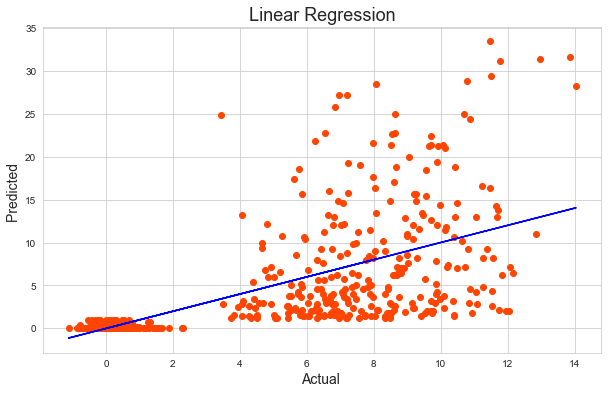

In [213]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orangered')
plt.plot(pred_test,pred_test,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Bagging Regressor

In [214]:
from sklearn.ensemble import BaggingRegressor
br= BaggingRegressor()

#training
#training_mlp
br.fit(x_train,y_train)
br_score= br.score(x_train,y_train)

#predict_mlp
pred_train = br.predict(x_train)
pred_test = br.predict(x_test)

#result_mlp
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test))

Training Accuracy r2_score  0.8983264726582569 Testing Accuracy R2_score  0.46410016217218863
Training Mean_squared_Error  2.273553761523559 Testing Mean_squared_error  12.484188727979214
Training Absolute_Error  0.5624276795794716 Testing Absolute Error 1.4567676653677268


## Model Cross Validation

In [215]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,10):
    br_cv_score=cross_val_score(br,x,y,cv=i)
    cv_mean=br_cv_score.mean()

    print(f"At CROSS_FOLD{i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, The Cross_Val_Score 0.3901160693227965 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD3, The Cross_Val_Score 0.3725785918742832 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD4, The Cross_Val_Score 0.41812108696792694 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD5, The Cross_Val_Score 0.40322111906567637 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD6, The Cross_Val_Score 0.40956597537073036 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD7, The Cross_Val_Score 0.41601690863012936 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD8, The Cross_Val_Score 0.41660875849387813 ,Training Score is 0.8983264726582569,Testing Score0.46410016217218863
At CROSS_FOLD9, The Cross_Val_Score 0.39443703909509353 ,Training Score is 0.8983264726582569,Testing Score0.4641

### Selected Cross Fold 4 Cross_Val_Score is near to training score.

In [216]:
# pred training for Random Forest
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Random Forest
br_cv_score=cross_val_score(br,x,y,cv=7) 
br_mean=br_cv_score.mean()

print("Cv_score of Model is ",br_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.41291631028994896  The Training Score is 0.8983264726582569 Testing Score Stands  0.46410016217218863


### Model Graph

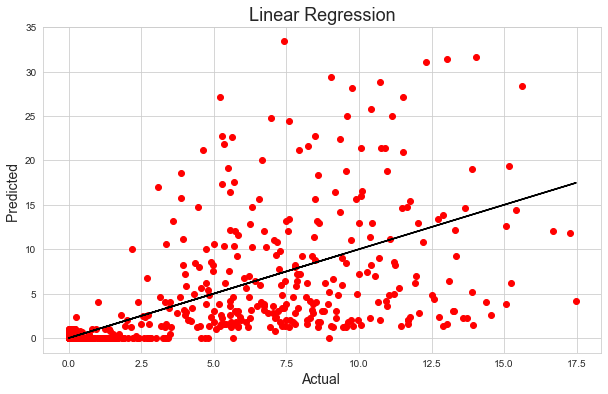

In [217]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='red')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# Hyper-Parameter With Models
Extra Trees Regressor and Random Forest, Gradient Boost Regressor are working very close
we selected them due the following reasons:
- R2 Score is better for the model.
- CV Score better for these model they are nearer to training score.
- "MSE" and "MAE" are less on compare to other models.(They are close to the mean)

# Extra Tress Regressor

In [219]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()

parameters={'n_estimators':list(range(100,105)),
            'criterion':['squared_error', 'absolute_error'],
            'max_features':['sqrt', 'log2','None'],
           'random_state':[44]}

gsv=GridSearchCV(etr,parameters,cv=9)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'squared_error', 'max_features': 'sqrt', 'n_estimators': 103, 'random_state': 44} Best Score  0.48010040394738585


In [222]:
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor(criterion= 'squared_error',n_estimators= 103, random_state= 44, n_jobs=2)

#training score
etr.fit(x_train,y_train)
etr_score=etr.score(x_train,y_train)

#predict
pred_train=etr.predict(x_train)
pred_test=etr.predict(x_test)

#result
print("Training Accuracy r2_score ",r2_score(y_train,pred_train),"Testing Accuracy R2_score ",r2_score(y_test,pred_test))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train),"Testing Absolute Error",mean_absolute_error(y_test,pred_test)) 

Training Accuracy r2_score  0.9990774768615555 Testing Accuracy R2_score  0.5053012857872485
Training Mean_squared_Error  0.020628830398038835 Testing Mean_squared_error  11.524377646303765
Training Absolute_Error  0.0028611057351160124 Testing Absolute Error 1.4210299002074003


## Cross Validation_Model

In [223]:
from sklearn.model_selection import cross_val_score

#training accuracy.
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

for i in range(2,20):
    etr_cv_score=cross_val_score(etr,x,y,cv=i)
    cv_mean=etr_cv_score.mean()

    print(f"At CROSS_FOLD {i}, The Cross_Val_Score {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD 2, The Cross_Val_Score 0.47068606760729104 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 3, The Cross_Val_Score 0.4632419612488435 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 4, The Cross_Val_Score 0.47471635897325265 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 5, The Cross_Val_Score 0.4609461408987124 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 6, The Cross_Val_Score 0.4722496395473726 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 7, The Cross_Val_Score 0.47849066795670464 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 8, The Cross_Val_Score 0.47715592038914656 ,Training Score is 0.9990774768615555,Testing Score0.5053012857872485
At CROSS_FOLD 9, The Cross_Val_Score 0.46309724740825625 ,Training Score is 0.9990774768615555,Testing Score0.5053

### Selected cross fold 7 as cv score is close to Traning Score

In [224]:
# pred training for Extra Trees
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)

#cross val with Extra Trees
etr_cv_score=cross_val_score(etr,x,y,cv=7) 
etr_mean=etr_cv_score.mean() #mean value

print("Cv_score of Model is ",etr_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.47849066795670464  The Training Score is 0.9990774768615555 Testing Score Stands  0.5053012857872485


### Graph

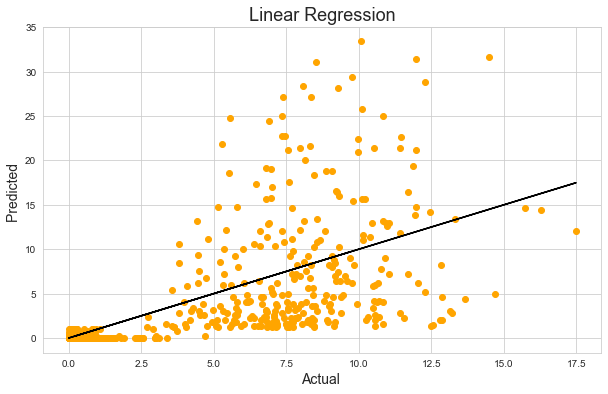

In [225]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orange')
plt.plot(pred_test,pred_test,color='black')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

# MLP Regressor

In [226]:
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
etr=MLPRegressor()

parameters={'activation':['identity', 'logistic', 'tanh', 'relu'],
            'solver':['lbfgs','sgd','adam'],
            'learning_rate':['constant', 'invscaling', 'adaptive'],
            'max_iter':[200],
           'random_state':[44]}

gsv=GridSearchCV(etr,parameters,cv=4)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'activation': 'logistic', 'learning_rate': 'constant', 'max_iter': 200, 'random_state': 44, 'solver': 'adam'} Best Score  0.5083096493817426


In [246]:
from sklearn.neural_network import MLPRegressor
mlp= MLPRegressor(activation='logistic', learning_rate= 'constant', max_iter= 200, random_state =44, 
                  solver= 'adam',beta_2=0.999,validation_fraction=0.1)

#training
#training_mlp
mlp.fit(x_train,y_train)
mlp_score= mlp.score(x_train,y_train)

#predict_mlp
pred_train1 = mlp.predict(x_train)
pred_test1 = mlp.predict(x_test)

#result_mlp
print("Training Accuracy r2_score ",r2_score(y_train,pred_train1),"Testing Accuracy R2_score ",r2_score(y_test,pred_test1))
print("Training Mean_squared_Error ",mean_squared_error(y_train,pred_train1),"Testing Mean_squared_error ",mean_squared_error(y_test,pred_test1))
print("Training Absolute_Error ",mean_absolute_error(y_train,pred_train1),"Testing Absolute Error",mean_absolute_error(y_test,pred_test1))

Training Accuracy r2_score  0.5206086982217959 Testing Accuracy R2_score  0.5271059055339654
Training Mean_squared_Error  10.719819857691055 Testing Mean_squared_error  11.016422672547456
Training Absolute_Error  1.3297004167806328 Testing Absolute Error 1.3981006481882625


## Cross Validation_Model

In [247]:
from sklearn.model_selection import cross_val_score

# testing
train_accuracy=r2_score(y_train,pred_train1)
test_accuracy =r2_score(y_test,pred_test1)

#cross validation
for i in range(2,10):
    mlp_cv_score=cross_val_score(mlp,x,y,cv=i)
    cv_mean=mlp_cv_score.mean()
    
    print(f"At CROSS_FOLD{i}, Cross_Val_Score is {cv_mean} ,Training Score is {train_accuracy},Testing Score{test_accuracy}")

At CROSS_FOLD2, Cross_Val_Score is 0.490613290536129 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD3, Cross_Val_Score is 0.507320576044579 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD4, Cross_Val_Score is 0.5154560629684302 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD5, Cross_Val_Score is 0.5136521020903801 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD6, Cross_Val_Score is 0.5143391769017637 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD7, Cross_Val_Score is 0.5156329018862201 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD8, Cross_Val_Score is 0.5190085664995134 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654
At CROSS_FOLD9, Cross_Val_Score is 0.5121820727196451 ,Training Score is 0.5206086982217959,Testing Score0.5271059055339654


### Selected cross fold 8 as cv score is close to Traning Score

In [248]:
# pred training for MLP Regressor
train_accuracy=r2_score(y_train,pred_train1)
test_accuracy=r2_score(y_test,pred_test1)

#cross val with MLP Regressor
mlp_cv_score=cross_val_score(mlp,x,y,cv=8) 
mlp_mean=mlp_cv_score.mean() # mean value

print("Cv_score of Model is ",mlp_mean," The Training Score is", train_accuracy,"Testing Score Stands " ,test_accuracy)

Cv_score of Model is  0.5190085664995134  The Training Score is 0.5206086982217959 Testing Score Stands  0.5271059055339654


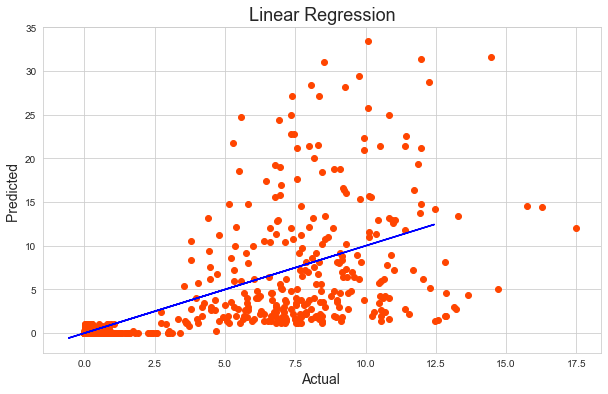

In [249]:
plt.figure(figsize=(10,6))
plt.scatter(x=pred_test,y=y_test,color='orangered')
plt.plot(pred_test1,pred_test1,color='blue')
plt.xlabel('Actual ',fontsize=14)
plt.ylabel('Predicted ',fontsize=14)
plt.title("Linear Regression",fontsize=18)
plt.show()

In [250]:
pred_en=en.predict(x_test) # predict test

en_cv_score=cross_val_score(mlp,x,y,cv=8)
en_cv_mean=en_cv_score.mean()
en_cv_mean*100

51.90085664995134

### Increament in cv_score is by 2 percentage 

- Training score,Testing score is close to cv_score. 
- Testing Mean_squared_error reduced to 11.016422672547456 saving MLP Model

# Saving Model

In [251]:
import pickle
filename='reg_modelrain.pkl'
pickle.dump(mlp,open(filename,'wb'))

In [252]:
import pickle
loaded_model =pickle.load(open('reg_modelrain.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

52.71059055339654


In [253]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],pred_test1[:]],index=["Predicted","Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021